<a href="https://colab.research.google.com/github/Croncl/Machine-Learning/blob/main/IMD3003/Projeto_ML_unsupervised.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#🧹 Carregamento e Pré-processamento dos Dados

> Adicionar aspas




In [ ]:
!pip install kagglehub[pandas-datasets]

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.impute import SimpleImputer
import kagglehub
from kagglehub import KaggleDatasetAdapter
import os
from IPython.display import display, HTML


display(HTML("""
<h2>1. Carregamento e Pré-processamento dos Dados</h2>
<p>Nesta etapa, importamos o dataset de músicas, selecionamos apenas as colunas numéricas relevantes e realizamos o tratamento de valores ausentes com a média. Em seguida, padronizamos os dados para garantir que todas as variáveis estejam na mesma escala.</p>

"""))

# Download do dataset
dataset_path = kagglehub.dataset_download("saurabhshahane/music-dataset-1950-to-2019")
print("Path to dataset files:", dataset_path)

# Leitura do arquivo CSV
file_path = f"{dataset_path}/tcc_ceds_music.csv"
df = pd.read_csv(file_path, encoding='latin-1')

# Visualização básica
print("Primeiros registros:")
print(df.head())
print("\nInformações do DataFrame:")
print(df.info())

# Seleção de colunas numéricas relevantes
numeric_features = [
    'dating', 'violence', 'world/life', 'night/time',
    'shake the audience', 'family/gospel', 'romantic',
    'communication', 'obscene', 'music', 'movement/places',
    'light/visual perceptions', 'family/spiritual', 'like/girls',
    'sadness', 'feelings', 'danceability', 'loudness',
    'acousticness', 'instrumentalness', 'valence', 'energy'
]

# Criação do dataset numérico
data_numeric = df[numeric_features].copy()

# Conversão para tipo numérico e imputação
for col in numeric_features:
    data_numeric[col] = pd.to_numeric(data_numeric[col], errors='coerce')

imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(data_numeric)

# Padronização
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print(f"\nFormato dos dados padronizados: {X_scaled.shape}")


100%|██████████| 9.73M/9.73M [00:00<00:00, 76.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/saurabhshahane/music-dataset-1950-to-2019/versions/3
Primeiros registros:
   Unnamed: 0           artist_name            track_name  release_date genre  \
0           0                mukesh  mohabbat bhi jhoothi          1950   pop   
1           4         frankie laine             i believe          1950   pop   
2           6           johnnie ray                   cry          1950   pop   
3          10          pÃ©rez prado              patricia          1950   pop   
4          12  giorgos papadopoulos    apopse eida oneiro          1950   pop   

                                              lyrics  len    dating  violence  \
0  hold time feel break feel untrue convince spea...   95  0.000598  0.063746   
1  believe drop rain fall grow believe darkest ni...   51  0.035537  0.096777   
2  sweetheart send letter goodbye secret feel bet...   24  0.002770  0.002770   
3  kiss lips want stroll charm mambo chacha merin...   54  0

#📊 Bloco 2 - Análise Exploratória

##📈 Visualização das Distribuições das Variáveis Padronizadas


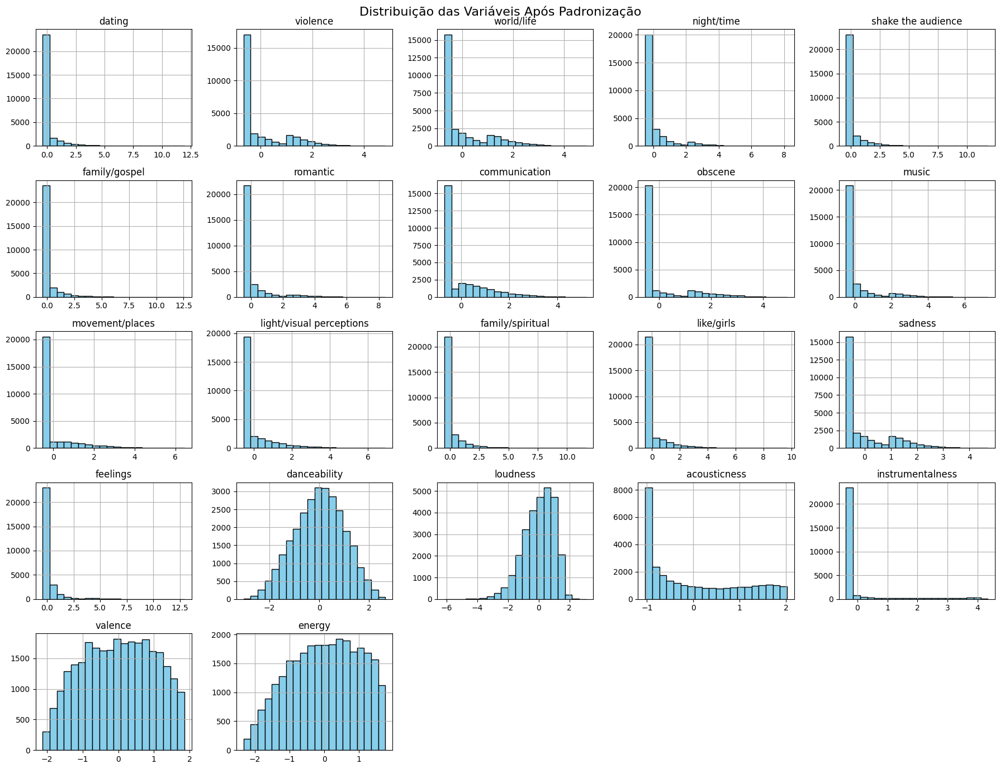

In [ ]:
# =============================
# Histogramas das Variáveis
# =============================
df_scaled = pd.DataFrame(X_scaled, columns=numeric_features)
df_scaled.hist(bins=20, figsize=(18, 14), color='skyblue', edgecolor='black')
plt.suptitle('Distribuição das Variáveis Após Padronização', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# =============================
# Explicação Interativa
# =============================
display(HTML("""
<div style='font-family:Arial; line-height:1.6; background-color:#111125; padding:15px; border-radius:5px'>
<h3 style='color:#2e86c1'>DISTRIBUIÇÃO DAS VARIÁVEIS</h3>

<p>Os histogramas mostram a <strong style='color:#f1c40f'>distribuição de frequência</strong> de cada variável numérica após a padronização (média zero e desvio padrão 1).</p>

<h4 style='color:#2e86c1'>Por que isso é importante?</h4>
<ul>
<li>Distribuições assimétricas ou com caudas longas podem influenciar a formação dos clusters.</li>
<li>Variáveis com pouca variância têm menos impacto no agrupamento.</li>
<li>A visualização ajuda a identificar outliers e padrões de densidade.</li>
</ul>

<p>Como todas as variáveis estão na mesma escala, podemos compará-las diretamente.</p>
</div>
"""))


##🚨 Detecção de Outliers com Boxplot e IQR


/tmp/ipython-input-5-1066863757.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_melted, x='variable', y='value', palette='coolwarm')


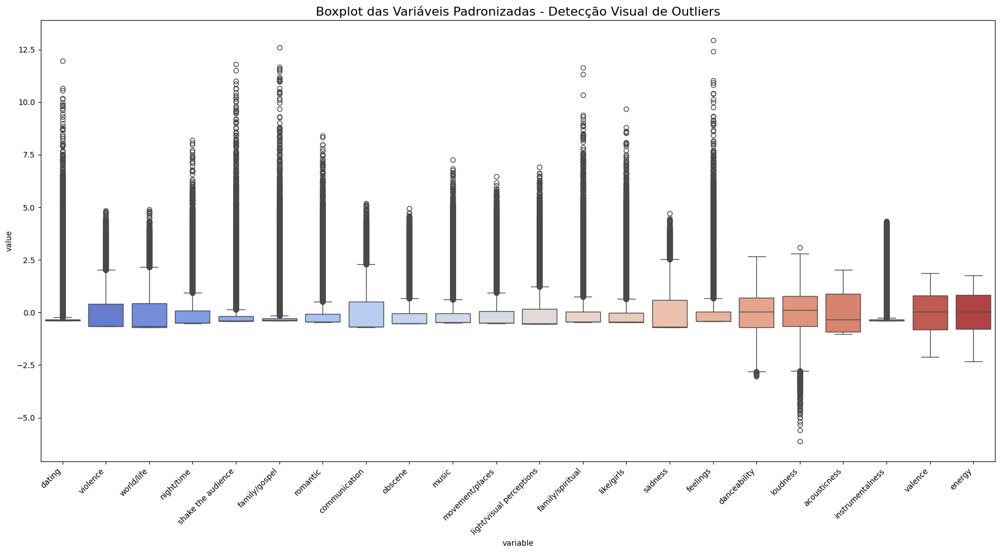

,Outliers
family/gospel,6541
dating,6508
instrumentalness,5929
shake the audience,5511
obscene,5371
like/girls,4568
movement/places,4120
music,3969
romantic,3955
family/spiritual,3740


In [ ]:
# =============================
# Detecção de Outliers - Boxplots
# =============================
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 10))
df_melted = pd.DataFrame(X_scaled, columns=numeric_features).melt()
sns.boxplot(data=df_melted, x='variable', y='value', palette='coolwarm')
plt.title('Boxplot das Variáveis Padronizadas - Detecção Visual de Outliers', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# =============================
# Detecção de Outliers - IQR
# =============================
outlier_counts = {}

# Cálculo de outliers com base no IQR
df_scaled = pd.DataFrame(X_scaled, columns=numeric_features)
for col in numeric_features:
    Q1 = df_scaled[col].quantile(0.25)
    Q3 = df_scaled[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_scaled[(df_scaled[col] < lower_bound) | (df_scaled[col] > upper_bound)]
    outlier_counts[col] = len(outliers)

# Exibir contagem de outliers por variável
outlier_df = pd.DataFrame.from_dict(outlier_counts, orient='index', columns=['Outliers'])
outlier_df = outlier_df.sort_values(by='Outliers', ascending=False)

display(HTML("<h3 style='color:#e74c3c'>🔎 Quantidade de Outliers por Variável (método IQR):</h3>"))
display(outlier_df.style.background_gradient(cmap='Reds'))


##🔥 Análise de Correlação com Heatmap

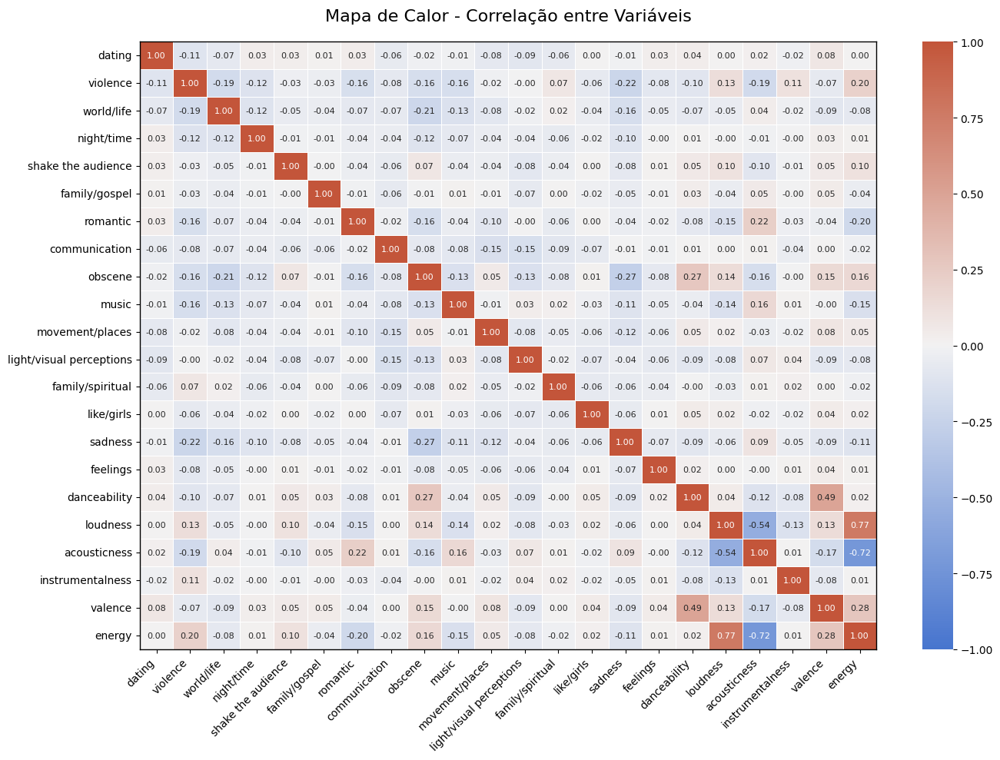

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, HTML

# =============================
# Heatmap de Correlação Aprimorado
# =============================
plt.figure(figsize=(14, 10))

# Paletas alternativas vivas: 'vlag', 'icefire', 'mako', 'rocket', 'flare'
heatmap = sns.heatmap(pd.DataFrame(X_scaled, columns=numeric_features).corr(),
                      annot=True,            # Mostra valores
                      fmt=".2f",             # 2 casas decimais
                      cmap=sns.diverging_palette(256, 20, as_cmap=True),           # Paleta alternativa vibrante
                      center=0,
                      vmin=-1, vmax=1,       # Escala fixa para correlação
                      linewidths=0.5,
                      annot_kws={"size": 8}, # Tamanho da fonte
                      cbar_kws={"shrink": 1}) # Barra de cores menor

# Melhorias estéticas
plt.title('Mapa de Calor - Correlação entre Variáveis', fontsize=16, pad=20)
plt.xticks(rotation=45, ha='right')  # Rotaciona rótulos do eixo X
plt.tight_layout()  # Ajuste automático do layout

# Adiciona borda ao heatmap
for _, spine in heatmap.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)

plt.show()
# =============================
# Explicação Interativa
# =============================
display(HTML("""
<div style='font-family:Arial; line-height:1.6; background-color:#111125; padding:15px; border-radius:5px'>
<h3 style='color:#2e86c1'>ANÁLISE DE CORRELAÇÃO ENTRE VARIÁVEIS</h3>

<p>O heatmap mostra a <strong style='color:#f1c40f'>correlação linear</strong> entre cada par de variáveis numéricas do conjunto de dados. A escala vai de -1 (correlação negativa perfeita) a +1 (correlação positiva perfeita).</p>

<h4 style='color:#2e86c1'>Como interpretar:</h4>
<ul>
<h4 style='color:#2e86c1'>Como interpretar:</h4>
<ul>
  <li><strong>Correlações positivas (próximas de 1):</strong> As variáveis se movem na mesma direção. Ex: Se "Renda" e "Nível Educacional" têm correlação 0.8, significa que tendem a aumentar juntas.</li>

  <li><strong>Correlações negativas (próximas de -1):</strong> As variáveis se movem em direções opostas. Ex: Se "Preço" e "Demanda" têm -0.7, quando o preço aumenta, a demanda tende a cair.</li>

  <li><strong>Correlações fracas (próximas de 0):</strong> Não há relação linear aparente. Ex: "Número de calçado" e "Q.I." geralmente mostram ~0.</li>
</ul>

<h4 style='color:#2e86c1'>Aplicações práticas:</h4>
<ul>
  <li><strong>Redundâncias:</strong> Identifique variáveis altamente correlacionadas (ex: >0.9) que podem ser removidas por fornecerem informação repetida.</li>

  <li><strong>Multicolinearidade:</strong> Detecte grupos de variáveis intercorrelacionadas que podem distorcer modelos estatísticos (problema comum em regressão). Variáveis com correlação > 0.8 ou < -0.8 são candidatas a multicolinearidade.</li>

  <li><strong>Agrupamento:</strong> Variáveis com padrões similares de correlação podem indicar dimensões subjacentes (útil para PCA ou clustering).</li>

  <li><strong>Seleção de features:</strong> Para machine learning, priorize variáveis com correlação moderada/forte com o target mas baixa entre si.</li>
</ul>

<div style='background-color:#515199; padding:12px; border-left: 4px solid #2e86c1; margin-top:10px'>
  <strong>Exemplo concreto:</strong> Se "Área construída" e "Número de quartos" têm 0.95 de correlação,
  você pode manter apenas uma para simplificar seu modelo sem perder informação relevante.
</div>
"""))

#🧩Análise de Componentes Principais (PCA - Principal Component Analysis)

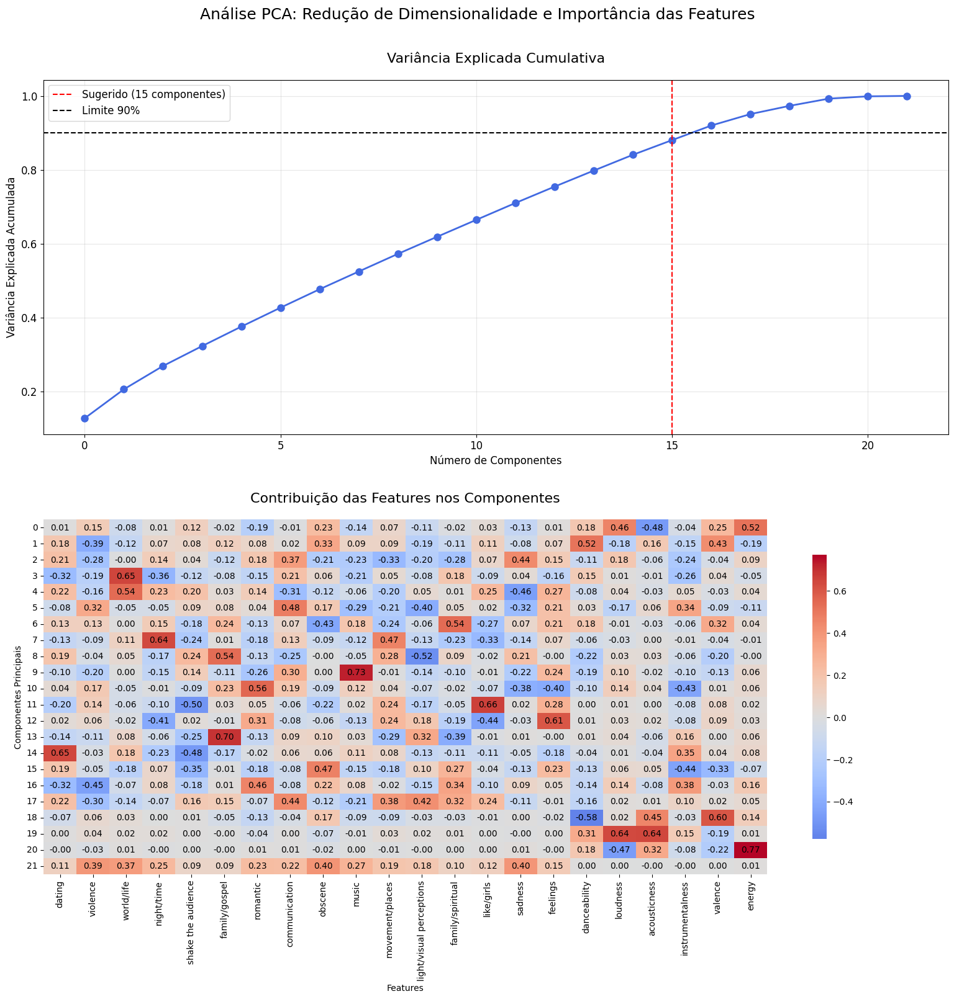

Valor,Interpretação
> 0.5,Contribuição fortemente positiva
0.2 - 0.5,Contribuição moderada
-0.5 - -0.2,Contribuição negativa
< -0.5,Contribuição fortemente negativa


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML
import numpy as np
import pandas as pd

# === 1. PCA completo ===
pca = PCA().fit(X_scaled)

# === 2. Contribuição das features ===
pca_components = pd.DataFrame(pca.components_, columns=numeric_features)

# === 3. Visualizações em dois gráficos grandes, um abaixo do outro ===
plt.style.use('default')  # Reset to light theme for plots
plt.figure(figsize=(16, 16))

# --- Gráfico 1: Variância Explicada Cumulativa ---
plt.subplot(2, 1, 1)
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='-',
         linewidth=2, markersize=8, color='royalblue')
plt.title('Variância Explicada Cumulativa', fontsize=16, pad=20, color='black')
plt.xlabel('Número de Componentes', fontsize=12, color='black')
plt.ylabel('Variância Explicada Acumulada', fontsize=12, color='black')
plt.axvline(x=15, color='red', linestyle='--', label='Sugerido (15 componentes)')
plt.axhline(y=0.90, color='black', linestyle='--', label='Limite 90%')
plt.legend(fontsize=12, frameon=True, facecolor='white')
plt.grid(True, alpha=0.3)
plt.xticks(fontsize=12, color='black')
plt.yticks(fontsize=12, color='black')
plt.gca().set_facecolor('white')

# --- Gráfico 2: Heatmap das Componentes ---
plt.subplot(2, 1, 2)
sns.heatmap(pca_components, cmap='coolwarm', center=0, annot=True, fmt=".2f",
            annot_kws={"size": 10, "color": "black"},
            cbar_kws={"shrink": 0.8})
plt.title("Contribuição das Features nos Componentes", fontsize=16, pad=20, color='black')
plt.xlabel("Features", fontsize=10, color='black')
plt.ylabel("Componentes Principais", fontsize=10, color='black')
plt.xticks(fontsize=10, rotation=90, color='black')
plt.yticks(fontsize=10, rotation=0, color='black')
plt.gca().set_facecolor('white')

plt.tight_layout(pad=3.0)
plt.suptitle("Análise PCA: Redução de Dimensionalidade e Importância das Features",
             fontsize=18, color='black', y=1.02)
plt.show()

# === 4. Explicação em HTML enriquecida (mantemos o fundo escuro) ===
display(HTML("""
<div style='font-family:Arial, sans-serif; line-height:1.7; background-color:#111125; color:#f0f0f0; padding:25px; border-radius:10px; border-left: 5px solid #3498db'>
    <h2 style='color:#3498db; margin-top:0; border-bottom: 1px solid #2e86c1; padding-bottom:10px'>🔍 Análise de Componentes Principais (PCA) - Guia Completo</h2>

    <div style='background-color:#1a1a2e; padding:15px; border-radius:8px; margin-bottom:20px'>
        <p style='margin-bottom:5px'><strong style='color:#f1c40f; font-size:18px'>🎯 Objetivo Principal:</strong></p>
        <p>Reduzir a dimensionalidade dos dados mantendo o máximo de informação (variância) possível, transformando features correlacionadas em componentes independentes.</p>
    </div>

    <div style='background-color:#1a1a2e; padding:15px; border-radius:8px; margin-bottom:20px'>
        <h3 style='color:#e67e22; margin-top:0'>📊 Gráfico de Variância Explicada</h3>

        <div style='display:flex; margin-bottom:15px'>
            <div style='flex:1; padding-right:15px; border-right:1px solid #444'>
                <p><strong style='color:#f1c40f'>O que mostra:</strong></p>
                <ul style='padding-left:20px'>
                    <li>Soma cumulativa da variância explicada por cada PC</li>
                    <li>Quantidade de informação preservada ao reduzir dimensões</li>
                    <li>Ponto de "retornos decrescentes" para adição de novos componentes</li>
                </ul>
            </div>
            <div style='flex:1; padding-left:15px'>
                <p><strong style='color:#f1c40f'>Como interpretar:</strong></p>
                <ul style='padding-left:20px'>
                    <li><span style='color:#2ecc71'>Linha em 95%</span>: Limite recomendado para preservação de informação</li>
                    <li><span style='color:#e74c3c'>Ponto de estabilização</span>: Número sugerido de componentes</li>
                    <li><span style='color:#9b59b6'>Área de ganhos marginais</span>: Componentes adicionais trazem pouca informação nova</li>
                </ul>
            </div>
        </div>

        <div style='background-color:#12121c; padding:12px; border-radius:6px; border-left:3px solid #f1c40f'>
            <p><strong>📌 No seu caso específico:</strong></p>
            <ul style='padding-left:20px'>
                <li>17 componentes explicam <strong>95%</strong> da variância</li>
                <li>15 componentes capturam ~<strong>90%</strong> (alternativa para evitar overfitting)</li>
                <li>Cada componente adicional além de 17 traz <strong><1%</strong> de ganho informacional</li>
            </ul>
        </div>
    </div>

    <div style='background-color:#1a1a2e; padding:15px; border-radius:8px; margin-bottom:20px'>
        <h3 style='color:#2ecc71; margin-top:0'>🔥 Heatmap de Contribuições</h3>
        <p>Mostra como cada feature original contribui para os componentes:</p>

        <table style='width:100%; border-collapse:collapse; margin:10px 0'>
            <tr>
                <th style='background-color:#2e86c1; padding:8px; text-align:left'>Valor</th>
                <th style='background-color:#2e86c1; padding:8px; text-align:left'>Interpretação</th>
            </tr>
            <tr>
                <td style='padding:8px; border-bottom:1px solid #444'>> 0.5</td>
                <td style='padding:8px; border-bottom:1px solid #444'>Contribuição <strong style='color:#2ecc71'>fortemente positiva</strong></td>
            </tr>
            <tr>
                <td style='padding:8px; border-bottom:1px solid #444'>0.2 - 0.5</td>
                <td style='padding:8px; border-bottom:1px solid #444'>Contribuição <strong>moderada</strong></td>
            </tr>
            <tr>
                <td style='padding:8px; border-bottom:1px solid #444'>-0.5 - -0.2</td>
                <td style='padding:8px; border-bottom:1px solid #444'>Contribuição <strong style='color:#e74c3c'>negativa</strong></td>
            </tr>
            <tr>
                <td style='padding:8px'>< -0.5</td>
                <td style='padding:8px'>Contribuição <strong style='color:#e74c3c'>fortemente negativa</strong></td>
            </tr>
        </table>

        <p><strong>Dica:</strong> Features com valores absolutos altos em um PC são as que mais definem aquela dimensão.</p>
    </div>

    <div style='background-color:#1a1a2e; padding:15px; border-radius:8px'>
        <h3 style='color:#9b59b6; margin-top:0'>💡 Aplicações Práticas</h3>

        <div style='display:flex; gap:15px; margin-bottom:15px'>
            <div style='flex:1; background-color:#12121c; padding:12px; border-radius:6px'>
                <p style='color:#9b59b6; font-weight:bold'>Clustering</p>
                <ul style='padding-left:20px'>
                    <li>Melhora a separação ao remover correlações</li>
                    <li>Visualização em 2D/3D com os primeiros PCs</li>
                    <li>Reduz o "curse of dimensionality"</li>
                </ul>
            </div>
            <div style='flex:1; background-color:#12121c; padding:12px; border-radius:6px'>
                <p style='color:#3498db; font-weight:bold'>Modelagem Preditiva</p>
                <ul style='padding-left:20px'>
                    <li>Reduz overfitting em datasets com muitas features</li>
                    <li>Acelera treinamento de modelos</li>
                    <li>Remove multicolinearidade</li>
                </ul>
            </div>
        </div>

        <div style='background-color:#12121c; padding:12px; border-radius:6px; border-left:3px solid #f1c40f'>
            <p><strong>🔧 Como usar seus resultados:</strong></p>
            <ol style='padding-left:20px'>
                <li>Para análise exploratória: Use 17 componentes (95% variância)</li>
                <li>Para modelos preditivos: Teste com 16 componentes (pouco mais de 90% variância)</li>
                <li>Para visualização: PC1 e PC2 ({}% variância combinada)</li>
            </ol>
        </div>
    </div>
</div>
""".format(round(pca.explained_variance_ratio_[:2].sum()*100, 1))))

#📊 Visualização: Método do Cotovelo x Silhueta

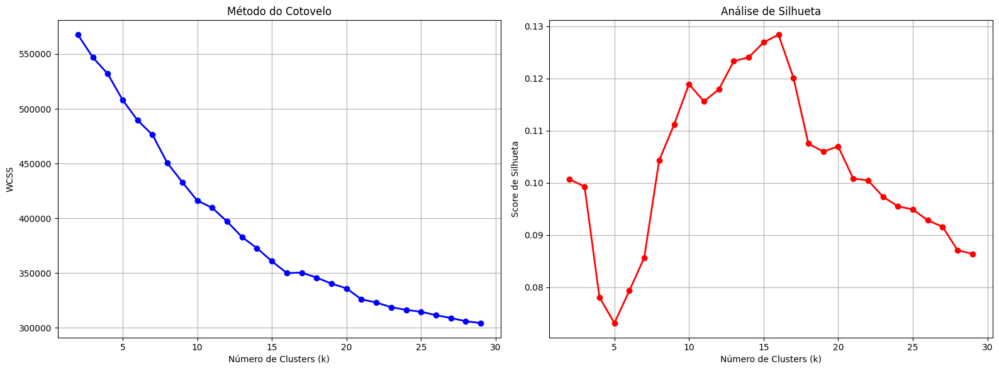


Tabela de Métricas por Número de Clusters:


N_Clusters,WCSS,Silhouette_Score,Reduction_WCSS,Reduction_Rate
2,567580.2951,0.1006,0.0000,0.0000
3,546970.6840,0.0993,20609.6111,0.0363
4,531900.8445,0.0781,15069.8396,0.0276
5,508039.4949,0.0731,23861.3496,0.0449
6,489490.6491,0.0793,18548.8458,0.0365
7,476192.5062,0.0857,13298.1429,0.0272
8,450437.5959,0.1043,25754.9103,0.0541
9,433003.9745,0.1112,17433.6214,0.0387
10,416223.6853,0.1189,16780.2893,0.0388
11,409674.1338,0.1156,6549.5515,0.0157



Sugestão de número ótimo de clusters:
- Pelo método do cotovelo (redução <10%): k = 2
- Pelo score máximo de silhueta: k = 16


In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd
from IPython.display import display, HTML

# ======================
# CONFIGURATION
# ======================
K_RANGE = range(2, 30)  # Range of clusters to test
RANDOM_STATE = 42       # For reproducibility
PLOT_SIZE = (16, 6)     # Figure size for plots

# ======================
# CLUSTERING ANALYSIS
# ======================
def perform_clustering_analysis(X_scaled, k_range):
    """Perform clustering analysis and return metrics."""
    wcss = []
    silhouette_scores = []

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE)
        labels = kmeans.fit_predict(X_scaled)
        wcss.append(kmeans.inertia_)

        # Silhouette score requires at least 2 clusters
        if k >= 2:
            score = silhouette_score(X_scaled, labels)
            silhouette_scores.append(score)

    return wcss, silhouette_scores

# ======================
# VISUALIZATION
# ======================
def plot_metrics(k_range, wcss, silhouette_scores):
    """Plot elbow method and silhouette analysis side by side."""
    fig, axs = plt.subplots(1, 2, figsize=PLOT_SIZE)

    # Elbow Method Plot
    axs[0].plot(k_range, wcss, 'bo-', linewidth=2)
    axs[0].set(xlabel='Número de Clusters (k)',
               ylabel='WCSS',
               title='Método do Cotovelo')
    axs[0].grid(True)

    # Silhouette Score Plot
    axs[1].plot(k_range, silhouette_scores, 'ro-', linewidth=2)
    axs[1].set(xlabel='Número de Clusters (k)',
               ylabel='Score de Silhueta',
               title='Análise de Silhueta')
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()

# ======================
# RESULTS PROCESSING
# ======================

def create_results_dataframe(k_range, wcss, silhouette_scores):
    """Create and format results dataframe."""
    results_df = pd.DataFrame({
        'N_Clusters': list(k_range),
        'WCSS': wcss,
        'Silhouette_Score': silhouette_scores,
        'Reduction_WCSS': [0] + [wcss[i-1] - wcss[i] for i in range(1, len(wcss))],
        'Reduction_Rate': [0] + [(wcss[i-1] - wcss[i]) / wcss[i-1] for i in range(1, len(wcss))]
    })

    return results_df

def display_single_column(df):
    """Display dataframe in a single column with clean styling."""
    # Apply styling
    style = """
    <style>
        .single-column {
            font-family: Arial, sans-serif;
            border-collapse: collapse;
            width: 100%;
            margin-bottom: 20px;
            margin-right: 20px;

        }
        .single-column th {
            background-color: #2e86c1;
            color: white;
            text-align: center;
            padding: 10px;
            position: sticky;
            top: 0;
        }
        .single-column td {
            border: 1px solid #ddd;
            padding: 8px;
            text-align: center;
        }
        .single-column tr:nth-child(odd) {
            background-color: #a8a8a8;  /* claro */
        }
        .single-column tr:nth-child(even) {
            background-color: #747474;  /* bem claro */
        }
        .single-column tr:hover {
            background-color: #24266f;  /* Azul mais forte no hover */
        }
    </style>
    """
    display(HTML(style))
    display(HTML(df.round(4).to_html(classes='single-column', index=False)))

# Example usage:
# results_df = create_results_dataframe(K_RANGE, wcss, silhouette_scores)
# display_single_column(results_df)

# ======================
# MAIN EXECUTION
# ======================
# Perform clustering analysis
wcss, silhouette_scores = perform_clustering_analysis(X_scaled, K_RANGE)

# Plot results
plot_metrics(K_RANGE, wcss, silhouette_scores)

# Create and display results
results_df = create_results_dataframe(K_RANGE, wcss, silhouette_scores)
print("\nTabela de Métricas por Número de Clusters:")
display_single_column(results_df)

# Find optimal k values
optimal_k_elbow = results_df['N_Clusters'][np.argmax(results_df['Reduction_Rate'] < 0.1)]
optimal_k_silhouette = results_df['N_Clusters'][results_df['Silhouette_Score'].idxmax()]

print(f"\nSugestão de número ótimo de clusters:")
print(f"- Pelo método do cotovelo (redução <10%): k = {optimal_k_elbow}")
print(f"- Pelo score máximo de silhueta: k = {optimal_k_silhouette}")

# Display explanation
display(HTML("""
<div style='font-family:Arial, sans-serif; background-color:#f5f5f5; color:#333; padding:25px; border-radius:12px; line-height:1.7; border-left: 5px solid #2e86c1;'>
  <h2 style='color:#2e86c1;'>🔎 Escolha do Número Ideal de Clusters: Cotovelo + Silhueta</h2>

  <p>Para encontrar o número ideal de clusters (<code>k</code>), combinamos dois métodos populares de avaliação:</p>

  <div style='background-color:#fff; padding:15px; border-radius:8px; margin-bottom:15px;'>
    <h3 style='color:#3498db;'>📉 Método do Cotovelo (WCSS)</h3>
    <p>Mostra o quanto os dados estão compactados dentro dos clusters. Procuramos o ponto onde adicionar novos clusters não reduz significativamente a variância interna (o <strong>cotovelo</strong>).</p>
    <ul>
      <li><strong>Antes do cotovelo:</strong> grandes ganhos na compactação.</li>
      <li><strong>Depois do cotovelo:</strong> ganhos marginais.</li>
      <li><strong>Critério objetivo:</strong> Redução percentual de WCSS inferior a 10%.</li>
    </ul>
  </div>

  <div style='background-color:#fff; padding:15px; border-radius:8px; margin-bottom:15px;'>
    <h3 style='color:#e67e22;'>📊 Score de Silhueta</h3>
    <p>Mede o quão bem cada ponto está agrupado. Varia de -1 (mau agrupamento) a 1 (clusters bem definidos).</p>
    <ul>
      <li><strong>Perto de 1:</strong> pontos bem agrupados e separados.</li>
      <li><strong>Perto de 0:</strong> possível sobreposição entre clusters.</li>
      <li><strong>Negativo:</strong> muitos pontos mal atribuídos.</li>
    </ul>
  </div>

  <div style='background-color:#e8f4fc; padding:15px; border-radius:8px;'>
    <h3 style='color:#2ecc71;'>🔗 Como usar os dois juntos</h3>
    <ol>
      <li>Observe o "cotovelo" no gráfico do WCSS.</li>
      <li>Verifique se o score de silhueta é alto nesse mesmo valor de <code>k</code>.</li>
      <li>Prefira <code>k</code> que equilibrem <strong>baixa WCSS</strong> com <strong>alta silhueta</strong>.</li>
    </ol>

    <p style='background-color:#12121c; color:#fff; padding:12px; border-left:4px solid #f1c40f;'>
      💡 <em>Exemplo:</em> Se <code>k = 4</code> marca o cotovelo <u>e</u> tem o maior score de silhueta, é uma ótima escolha!
    </p>
  </div>
</div>
"""))

#🌳 Dendrograma (Clustering Hierárquico)

> Adicionar aspas




🟩 Corte dinâmico com segunda derivada: 15.73

=== Dendrograma ===


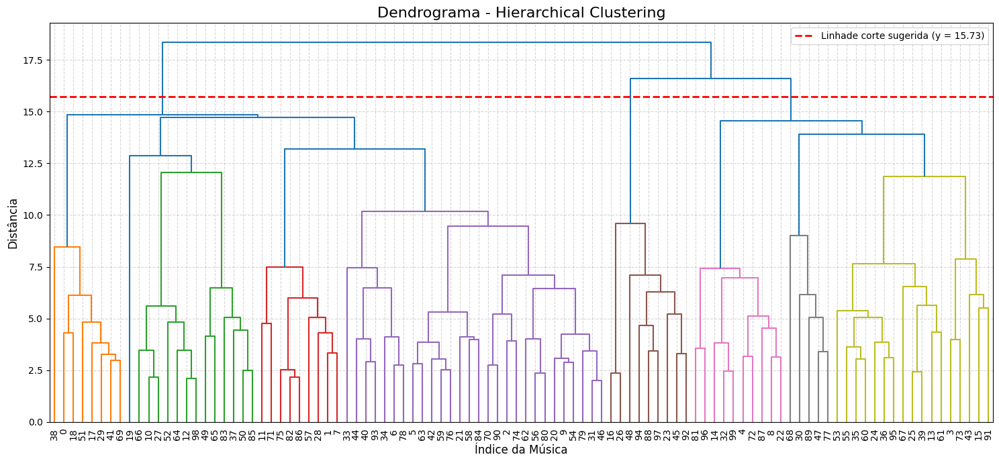

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from IPython.display import HTML, display
import numpy as np

# === FORÇA o estilo claro do matplotlib ===
plt.style.use('default')

# === Usamos apenas 100 amostras para melhor visualização ===
X_subset = X_scaled[:100]

# === Cálculo do linkage ===
linked = linkage(X_subset, method='ward')

# === Cálculo automático do ponto de corte (maior salto de distância) ===
#distances = linked[:, 2]
#deltas = np.diff(distances)
#max_jump_idx = np.argmax(deltas)
#corte_dinamico = round((distances[max_jump_idx] + distances[max_jump_idx + 1]) / 2, 2)

# === Cálculo do corte com segunda derivada (mais sensível) ===
distances = linked[:, 2]
deltas = np.diff(distances)
second_derivative = np.diff(deltas)
max_dd_index = np.argmax(second_derivative)

# O índice corresponde à posição na lista de distâncias
# Como usamos diff duas vezes, precisamos compensar o deslocamento de índice
idx = max_dd_index + 1
corte_dinamico = round((distances[idx] + distances[idx + 1]) / 2, 2)

print(f"🟩 Corte dinâmico com segunda derivada: {corte_dinamico}")

# === Exibição do dendrograma ===
print("\n=== Dendrograma ===")
plt.figure(figsize=(15, 7))
plt.title('Dendrograma - Hierarchical Clustering', fontsize=16)
plt.xlabel('Índice da Música', fontsize=12)
plt.ylabel('Distância', fontsize=12)

dend = dendrogram(
    linked,
    leaf_rotation=90,
    leaf_font_size=10
)

# === Linha de corte dinâmica ===
plt.axhline(y=corte_dinamico, color='red', linestyle='--', linewidth=2, label=f'Linhade corte sugerida (y = {corte_dinamico})')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# === Explicação HTML interativa ===
display(HTML(f"""
<div style='font-family:Arial; background-color:#111125; color:#f0f0f0; padding:22px; border-radius:12px'>
  <h2 style='color:#1abc9c'>🏗️ Clustering Hierárquico e Dendrograma</h2>

  <p><strong>O que é?</strong><br>
  O Clustering Hierárquico é uma técnica de agrupamento que constrói uma árvore (dendrograma), fundindo elementos semelhantes em etapas até formar um único grande grupo. Cada passo representa uma fusão entre pontos ou clusters anteriores.</p>

  <h3 style='color:#e67e22'>📊 Como interpretar o Dendrograma?</h3>
  <ul>
    <li>Cada linha horizontal representa uma <strong>fusão entre dois grupos</strong>.</li>
    <li>O <strong>eixo vertical</strong> mostra a distância entre os grupos no momento da fusão (quanto maior, mais diferentes).</li>
    <li><strong>Linhas mais próximas da base</strong> indicam fusões entre elementos muito semelhantes.</li>
    <li>Linhas mais altas mostram fusões entre grupos mais distantes (menos semelhantes).</li>
    <li>As ramificações formam uma árvore binária que mostra o histórico completo de fusões.</li>
  </ul>

  <h3 style='color:#9b59b6'>✂️ Como decidir o número de clusters (k)?</h3>
  <ol>
    <li>Trace uma <strong>linha horizontal</strong> em um nível alto do dendrograma.</li>
    <li>Conte quantas <strong>ramificações verticais</strong> essa linha intercepta. Esse é o número de clusters.</li>
    <li>Idealmente, escolha um ponto onde ocorra um <strong>"salto" grande</strong> na altura entre fusões — indicando que grupos menos similares estão sendo unidos.</li>
  </ol>

  <p style='background-color:#1c1c2b; padding:12px; border-left:5px solid #2980b9'>
    🎯 <strong>Linha de corte sugerida automaticamente:</strong><br>
    A linha de corte foi traçada em <strong>y = {corte_dinamico}</strong> com base no maior salto observado nas distâncias de fusão entre grupos. Essa abordagem indica o ponto onde elementos **menos semelhantes começaram a ser agrupados**, o que ajuda a determinar uma separação natural e coerente entre os clusters.
  </p>

  <h3 style='color:#2ecc71'>📌 Exemplo de Interpretação:</h3>
  <p>Se você traçar uma linha horizontal em altura 10 e ela interceptar 4 ramificações principais, isso sugere que 4 clusters principais existem. Essas são as 4 regiões do gráfico que se formaram a partir de grandes saltos de distância.</p>

  <h3 style='color:#3498db'>🎵 Aplicação em Música:</h3>
  <ul>
    <li>Músicas com características acústicas similares tendem a se agrupar mais cedo (baixo no dendrograma).</li>
    <li>Músicas dançantes e energéticas, mais diferentes das acústicas, podem se fundir mais tarde (mais alto).</li>
    <li>Você pode usar isso para identificar categorias como:
      <ul>
        <li>🎼 Baladas suaves</li>
        <li>🎧 Eletrônicas agitadas</li>
        <li>🎤 Vocais pop intermediários</li>
      </ul>
    </li>
  </ul>

  <p style='background-color:#1c1c2b; padding:12px; border-left:5px solid #f39c12'>
    💡 <strong>Dica:</strong><br>
    Combine a interpretação visual do dendrograma com os métodos quantitativos como Silhueta e Cotovelo para validar sua escolha de <code>k</code> de forma mais robusta.
  </p>
</div>
"""))


#🤖 Visualização K-means(k = [3, 8]) utilizando todas as features X PCA (n = [5, 15])



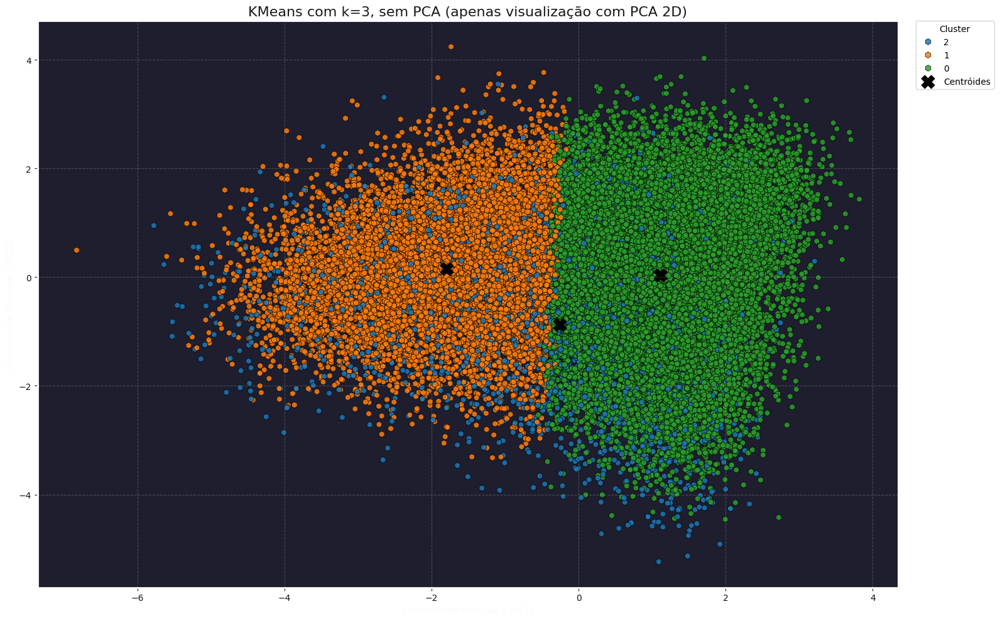

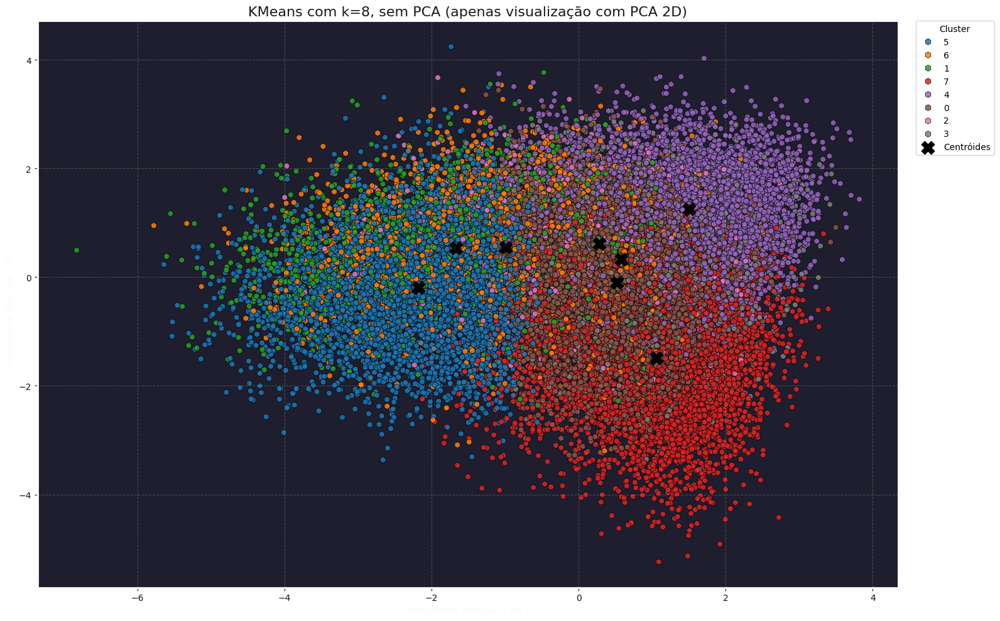

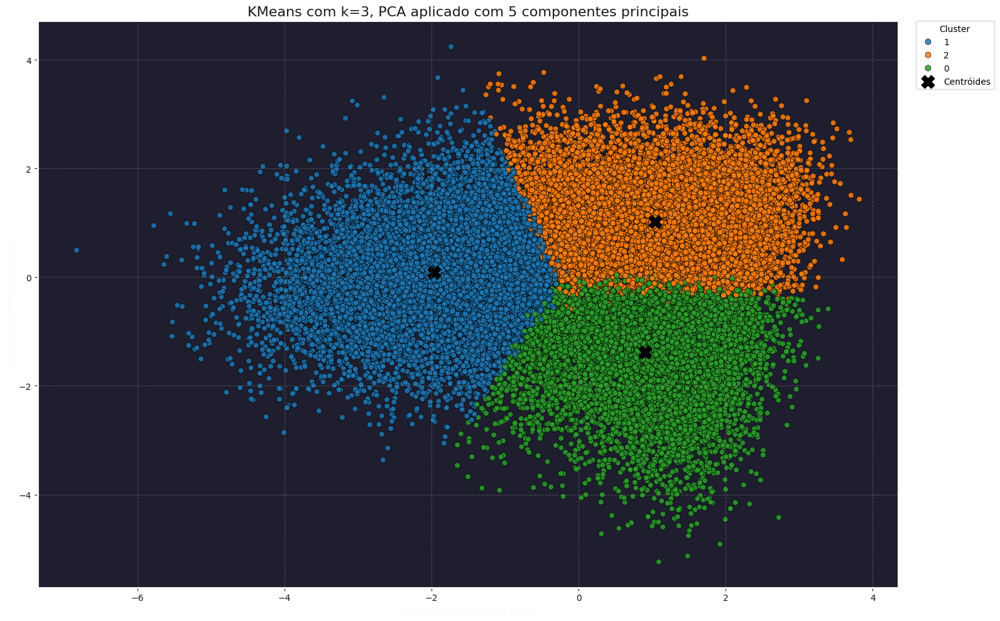

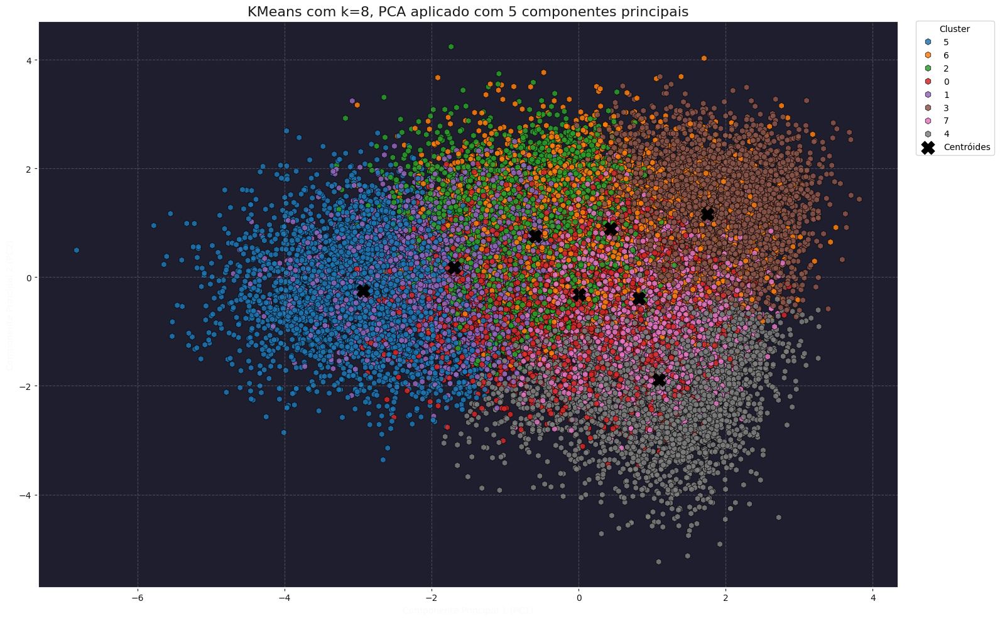

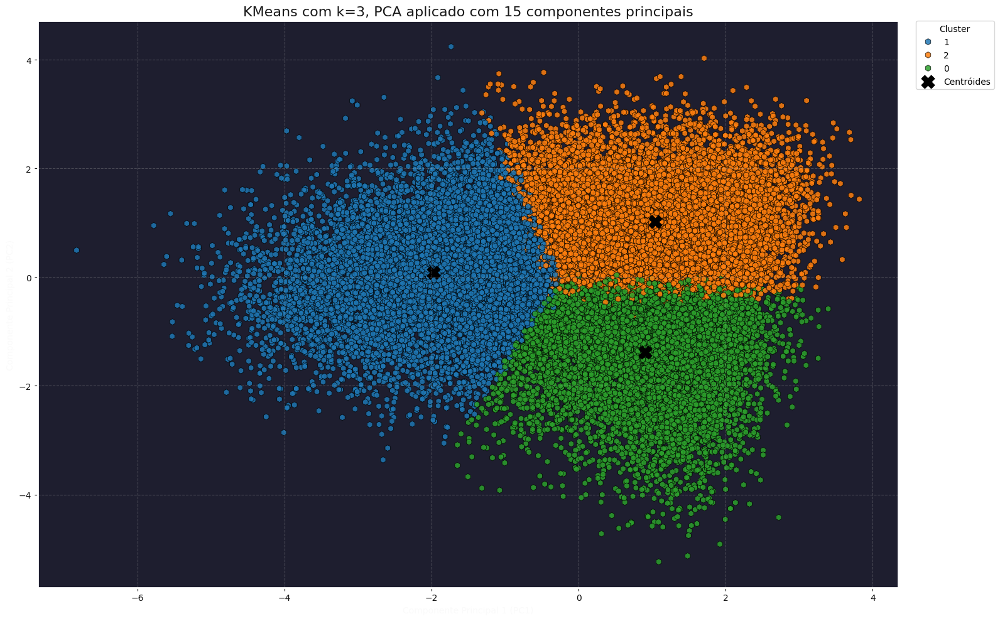

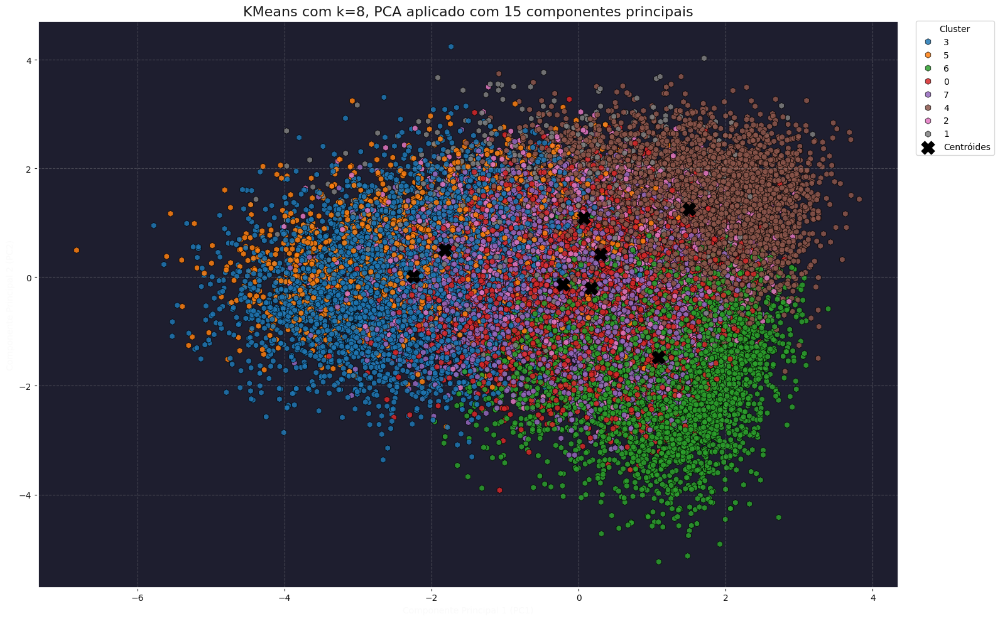

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML

# === Pré-processamento ===
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_numeric)  # Substitua pelo seu DataFrame

# === Função para visualização ===
def plot_clusters(X_plot, labels, centroids, k, pca_aplicado, n_components=None):
    df_vis = pd.DataFrame(X_plot, columns=['PC1', 'PC2'])
    df_vis['Cluster'] = labels.astype(str)

    plt.figure(figsize=(16, 10))
    ax = plt.gca()
    ax.set_facecolor('#1e1e2f')
    palette = sns.color_palette("tab10", len(np.unique(labels)))

    sns.scatterplot(
        x='PC1', y='PC2',
        hue='Cluster',
        data=df_vis,
        palette=palette,
        s=50,
        alpha=0.85,
        edgecolor='black',
        marker='h'  # ← pontos em formato hexagonal
    )

    # Centróides (projetados em 2D ou PCA diretamente)
    plt.scatter(
        centroids[:, 0], centroids[:, 1],
        c='black', s=220, marker='X', label='Centróides'
    )

    # Título com os parâmetros
    if pca_aplicado:
        title = f"KMeans com k={k}, PCA aplicado com {n_components} componentes principais"
    else:
        title = f"KMeans com k={k}, sem PCA (apenas visualização com PCA 2D)"

    # Configura a moldura
    for spine in ax.spines.values():
        spine.set_edgecolor('white')
        spine.set_linewidth(2)
        spine.set_linestyle('-')

    plt.title(title, fontsize=16, color='#1a1a1a')
    plt.xlabel("Componente Principal 1 (PC1)", color='#fafafa')
    plt.ylabel("Componente Principal 2 (PC2)", color='#fafafa')
    plt.gca().set_facecolor('#1e1e2f')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tick_params(colors='#131313')
    plt.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.tight_layout()
    plt.show()

# === Experimentos ===
configuracoes = [
    {"pca": False, "n_components": None, "k": 3},
    {"pca": False, "n_components": None, "k": 8},
    {"pca": True,  "n_components": 5, "k": 3},
    {"pca": True,  "n_components": 5, "k": 8},
    {"pca": True,  "n_components": 15, "k": 3},
    {"pca": True,  "n_components": 15, "k": 8},
]

for config in configuracoes:
    pca_aplicado = config["pca"]
    k = config["k"]
    n_components = config["n_components"]

    if pca_aplicado:
        pca = PCA(n_components=n_components)
        X_proj = pca.fit_transform(X_scaled)

        # Clusterização no espaço PCA
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto', max_iter=1000)
        labels = kmeans.fit_predict(X_proj)

        # Projeção em 2D para visualização
        X_vis = X_proj[:, :2]
        centroids_vis = kmeans.cluster_centers_[:, :2]
    else:
        # Clusterização no espaço original
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto', max_iter=1000)
        labels = kmeans.fit_predict(X_scaled)

        # Projeção PCA só para visualização (não usada no clustering)
        pca_vis = PCA(n_components=2)
        X_vis = pca_vis.fit_transform(X_scaled)
        centroids_vis = pca_vis.transform(kmeans.cluster_centers_)

    plot_clusters(X_vis, labels, centroids_vis, k, pca_aplicado, n_components)


from IPython.display import display, HTML

display(HTML("""
<div style='font-family: Arial, sans-serif; background:#111125; color:#eee; padding:20px; border-radius:12px; max-width:900px'>

  <h2 style='color:#1abc9c;'>🤖 Bloco 7: Clusterização com KMeans (PCA 2D e Sem PCA)</h2>

  <h3 style='color:#3498db;'>🎯 Objetivo</h3>
  <ul>
    <li>Agrupar amostras similares com o algoritmo <strong>KMeans</strong>.</li>
    <li>Comparar os agrupamentos ao aplicar <strong>PCA com diferentes números de componentes</strong> e <strong>sem PCA</strong>.</li>
    <li>Visualizar os clusters em 3D usando os 3 primeiros componentes principais para interpretação visual.</li>
  </ul>

  <h3 style='color:#e67e22;'>📌 Diferenças entre com e sem PCA</h3>
  <ul>
    <li><strong>Sem PCA:</strong> o algoritmo KMeans trabalha diretamente com todas as variáveis originais (após padronização), podendo capturar nuances mais específicas, mas também é mais suscetível a ruído ou colinearidade.</li>
    <li><strong>Com PCA (k componentes):</strong> reduz a dimensionalidade, retendo apenas as <em>k direções mais informativas</em> dos dados. Isso:
      <ul>
        <li>💡 <strong>Reduz ruído</strong> e acelera o treinamento;</li>
        <li>⚠️ <strong>Pode descartar variância relevante</strong> se k for muito pequeno;</li>
        <li>🔍 Ideal para explorar a estrutura global dos dados.</li>
      </ul>
    </li>
  </ul>

  <h3 style='color:#9b59b6;'>📊 Sobre a Perda de Informação</h3>
  <ul>
    <li>PCA ordena os componentes pela variância explicada.</li>
    <li>Ao usar apenas 5 componentes, parte da variância original dos dados é descartada.</li>
    <li>Com 15 componentes, preserva-se mais informação (~90%+ normalmente), resultando em clustering mais próximo do original.</li>
    <li>A variância explicada pelas 3 primeiras componentes é usada apenas para visualização em 3D e será exibida nos gráficos.</li>
  </ul>

  <h3 style='color:#2ecc71;'>📌 Interpretação dos Gráficos</h3>
  <ul>
    <li>Gráficos mostram a projeção 3D das amostras (PC1, PC2, PC3), coloridas por cluster atribuído.</li>
    <li>Clusters bem separados sugerem boa segmentação.</li>
    <li>Sobreposição pode indicar que a redução de dimensão foi muito agressiva ou que o valor de <code>k</code> não é ideal.</li>
  </ul>

  <h3 style='color:#f39c12;'>🔢 Experimentos realizados</h3>
  <ul>
    <li>🔹 <strong>Sem PCA</strong>: k = 3 e k = 8</li>
    <li>🔹 <strong>Com PCA (5 componentes)</strong>: k = 3 e k = 8</li>
    <li>🔹 <strong>Com PCA (15 componentes)</strong>: k = 3 e k = 8</li>
  </ul>

  <p style='background:#1c1c2b; padding:12px; border-left:5px solid #9b59b6;'>
    🎵 <strong>Aplicação musical:</strong><br>
    Os clusters podem representar estilos musicais distintos, como:<br>
    - músicas dançantes e alegres<br>
    - faixas introspectivas e acústicas<br>
    - sons energéticos e eletrônicos
  </p>

</div>
"""))



# 🔹 PCA (2D) com intensidade baseada em PCA 17D

In [ ]:
!pip install adjustText

In [ ]:
print(plt.style.available)


['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'petroff10', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


🎯 Top 5 features most important in PCA:
family/gospel    0.967520
night/time       0.921111
feelings         0.919333
like/girls       0.917516
music            0.842470
dtype: float64


/tmp/ipython-input-13-1208133980.py:143: UserWarning: Glyph 127925 (\N{MUSICAL NOTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127925 (\N{MUSICAL NOTE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


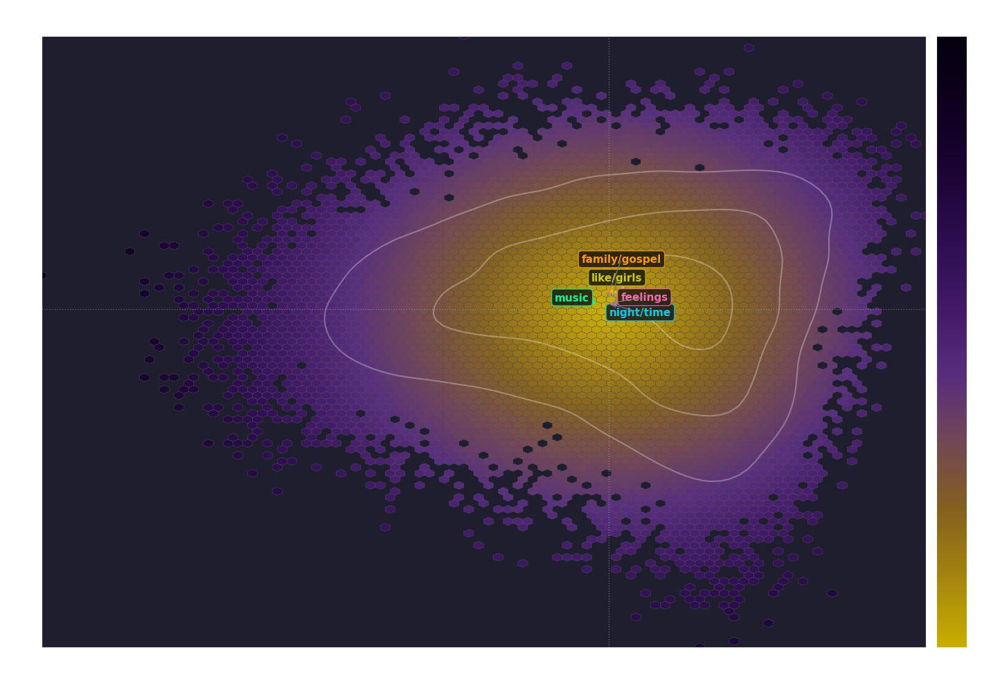

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy import stats
from adjustText import adjust_text  # <-- Import para ajuste automático das anotações

# === 1. PCA with 17 components ===
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_scaled)

# === 2. Clustering (optional reference) ===
k = 10
kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
labels = kmeans.fit_predict(X_pca)

# === 3. DataFrame with first two components ===
df_pca_vis = pd.DataFrame(X_pca[:, :2], columns=['PC1', 'PC2'])
df_pca_vis['Cluster'] = labels

# === 4. Intensity (distance from origin) ===
df_pca_vis['intensity'] = np.linalg.norm(X_pca[:, :2], axis=1)

# === 5. Variable loadings ===
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=data_numeric.columns
)

# === 6. Top 5 most important variables ===
feature_importance = (loadings ** 2).sum(axis=1)
top_features = feature_importance.sort_values(ascending=False).head(5)
print("🎯 Top 5 features most important in PCA:")
print(top_features)

# === 7. Annotation coordinates ===
annotations = {}
colors = ['#ff9900', '#00ccff', '#ff66b3', '#cccc00', '#00ff99']  # Colorful annotations
for feature, color in zip(top_features.index, colors):
    x = loadings.loc[feature, 'PC1']
    y = loadings.loc[feature, 'PC2']
    annotations[feature] = (x, y, color)

# === 8. HEXBIN Visualization ===
plt.figure(figsize=(16, 10))
plt.style.use('dark_background')  # Dark theme

# Colormap ultra-escuro - Amarelo queimado para Roxo negro
cmap = LinearSegmentedColormap.from_list('midnight_gold_purple', [
    '#D4B800',   # Dark aged gold
    '#B08D10',   # Deep bronze
    '#8C6720',   # Oxidized copper
    '#7A4C58',   # Blackberry wine
    '#5D3085',   # Royal purple
    '#451C6D',   # Midnight purple
    '#300E55',   # Blackcurrant
    '#1E0538',   # Deepest violet
    '#0E0020',   # Near-black purple
    '#070010'    # Absolute darkest
])

hb = plt.hexbin(
    df_pca_vis['PC1'],
    df_pca_vis['PC2'],
    C=df_pca_vis['intensity'],
    cmap=cmap,  # Colormap intenso
    gridsize=90,
    linewidths=0.3,
    edgecolors='#555555',
    mincnt=1,
    alpha=0.95
)

# Variable annotations com ajuste automático para evitar sobreposição
texts = []
for feature, (x, y, color) in annotations.items():
    txt = plt.annotate(
        feature,
        xy=(x, y),
        xytext=(x * 1.3, y * 1.3),
        color=color,
        fontsize=11,
        ha='center',
        fontweight='bold',
        arrowprops=dict(
            arrowstyle="->",
            color=color,
            lw=2,
            shrinkA=5,
            shrinkB=5
        ),
        bbox=dict(
            boxstyle='round,pad=0.3',
            fc='#111111',
            ec=color,
            lw=1,
            alpha=0.8
        )
    )
    texts.append(txt)

# Ajuste automático das anotações para não se sobreporem
adjust_text(
    texts,
    only_move={'points':'y', 'text':'xy'},
    arrowprops=dict(arrowstyle='->', color='gray', lw=0.8),
    expand_points=(1.2, 1.4),
    expand_text=(1.2, 1.4)
)

# Center axes
plt.axhline(0, color='white', linestyle=':', alpha=0.3, lw=1)
plt.axvline(0, color='white', linestyle=':', alpha=0.3, lw=1)

# Colorbar
cb = plt.colorbar(hb, pad=0.01)
cb.set_label('Point Density (Distance from Center)', color='white')
cb.ax.yaxis.set_tick_params(color='white')
plt.setp(plt.getp(cb.ax.axes, 'yticklabels'), color='white')

# KDE contours
x = df_pca_vis['PC1'].values
y = df_pca_vis['PC2'].values
kde = stats.gaussian_kde([x, y])
xx, yy = np.mgrid[x.min():x.max():100j, y.min():y.max():100j]
density = kde(np.vstack([xx.ravel(), yy.ravel()]))
plt.contour(xx, yy, density.reshape(xx.shape), levels=3, colors='white', alpha=0.3)

# Titles and labels
plt.title('🎵 PCA 2D Projection with Hexbin Density',
          fontsize=14, pad=20, color='white')
plt.xlabel(f'PC1 - {pca.explained_variance_ratio_[0]*100:.1f}%',
           color='white')
plt.ylabel(f'PC2 - {pca.explained_variance_ratio_[1]*100:.1f}%',
           color='white')

plt.grid(True, linestyle=':', alpha=0.2, color='#23232f')
plt.gca().set_facecolor('#1e1e2f')  # Dark background
plt.tight_layout()
plt.show()


from IPython.display import display, HTML

display(HTML(f"""
<div style='font-family:Arial, sans-serif; background-color:#111125; color:#f0f0f0; padding:24px; border-radius:12px; max-width:900px; line-height:1.5'>
  <h2 style='color:#1abc9c'>🎵 Interpretação do Gráfico PCA 2D com Hexbin e Anotações das Features</h2>

  <h3 style='color:#e67e22'>📌 O que é o PCA e esse gráfico?</h3>
  <p>
    A Análise de Componentes Principais (PCA) é uma técnica que reduz a dimensionalidade dos dados, condensando a maior parte da variabilidade em poucos componentes (aqui usamos 2 para visualização).
    Cada ponto no gráfico representa uma música projetada nesses dois componentes principais (PC1 e PC2), que são combinações lineares das variáveis originais.
  </p>

  <h3 style='color:#e67e22'>🌈 O que representa a densidade do hexbin?</h3>
  <p>
    O gráfico usa <strong>hexbin</strong>, uma forma de mostrar a concentração de pontos no espaço 2D.
    Cores mais claras/amareladas indicam regiões com maior densidade de músicas próximas, enquanto tons mais escuros/púrpuras indicam regiões mais vazias.
    Isso revela aglomerações naturais, grupos ou padrões nos dados musicais.
  </p>

  <h3 style='color:#e67e22'>🔑 As variáveis mais importantes (features anotadas)</h3>
  <p>
    As setas apontam para as <strong>5 features</strong> mais relevantes para a construção dos componentes principais, identificadas pelo somatório dos quadrados dos seus coeficientes (loadings) nas 17 PCs.
  </p>
  <ul>
    <li><strong>Posição das setas:</strong> indicam a direção em que cada feature “puxa” a distribuição dos dados.</li>
    <li><strong>Comprimento da seta:</strong> mostra a força da contribuição da feature para a variabilidade representada por esses PCs.</li>
    <li><strong>Direção da seta:</strong> se aponta para uma região do gráfico, significa que os pontos (músicas) próximos têm valores maiores dessa feature.</li>
  </ul>

  <h3 style='color:#e67e22'>⚖️ Interpretação das posições das músicas e clusters</h3>
  <p>
    - Músicas próximas à origem (0,0) têm valores médios ou baixos nas features mais fortes.<br>
    - Músicas afastadas da origem possuem valores mais extremos em pelo menos uma das features principais.<br>
    - Regiões densas indicam agrupamentos naturais; cores diferentes no cluster identificam grupos (k=3 aqui).<br>
  </p>

  <h3 style='color:#e67e22'>⭐ O que significa um feature estar mais "central" no gráfico?</h3>
  <p>
    Quando uma feature tem coordenadas próximas ao centro do gráfico (origem), isso significa que ela tem pouca contribuição para diferenciar os dados naquele plano 2D. Ou seja, essa feature varia pouco entre os grupos observados aqui.<br>
    Por outro lado, features com posições mais afastadas do centro exercem maior influência para separar os dados em diferentes regiões.
  </p>

  <h3 style='color:#e67e22'>🎯 Exemplo prático</h3>
  <p>
    Se a seta da feature <em>“tempo_médio”</em> aponta para a direita e para cima, isso indica que músicas situadas nessa região do gráfico tendem a ter tempos médios maiores.<br>
    Se outra seta, por exemplo, <em>“energia”</em>, aponta para baixo e esquerda, as músicas nessa região têm baixos valores de energia.<br>
    Isso ajuda a entender quais características influenciam cada cluster ou agrupamento de músicas.
  </p>

  <h3 style='color:#e67e22'>⚙️ Resumo prático para análise</h3>
  <ul>
    <li>Use a posição das setas para entender quais variáveis “dirigem” as diferenças entre as músicas.</li>
    <li>Observe a cor e densidade para identificar grupos naturais no conjunto.</li>
    <li>Considere as distâncias dos pontos à origem como um indicativo de intensidade combinada das principais variáveis.</li>
  </ul>

  <h3 style='color:#e67e22'>💡 Nota final</h3>
  <p>
    O PCA e o hexbin juntos permitem uma análise visual robusta para explorar padrões, identificar grupos e interpretar a influência das variáveis num espaço reduzido, facilitando a compreensão da estrutura complexa dos dados musicais.
  </p>
</div>
"""))


#🤖 Visualização K-means 3D: PCA 15 e K = 3

In [ ]:
import plotly.express as px
import plotly.io as pio

# Defina o número de componentes e clusters desejado
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_scaled)

# KMeans com K=3
k = 8
kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
labels = kmeans.fit_predict(X_pca)

# Variância explicada pelos 3 primeiros PCs
variancia_3d = pca.explained_variance_ratio_[:3].sum()
print(f"🎯 Variância explicada pelos 3 primeiros PCs: {variancia_3d * 100:.2f}%")

# DataFrame para visualização 3D
df_pca_3d = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'PC3': X_pca[:, 2],
    'Cluster': labels.astype(str),  # Para usar cores categóricas
    'Índice': range(len(X_pca))
})

# Paleta de cores com boa distinção visual (até 10 cores)
color_sequence = [
    '#1abc9c', '#e74c3c', '#9b59b6', '#f1c40f',
    '#3498db', '#e67e22', '#2ecc71', '#e84393'
]

# Gráfico interativo 3D com fundo escuro e cores diferenciadas
fig = px.scatter_3d(
    df_pca_3d,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    color_discrete_sequence=color_sequence,
    hover_data=['Índice'],
    opacity=0.85,
    title='🎵 Visualização PCA 3D com K-Means (K=3)'
)

# Estilo visual escuro e ajustes finos
fig.update_traces(marker=dict(size=5))

fig.update_layout(
    scene=dict(
        xaxis=dict(title='PC1', backgroundcolor='#b4b4b4', gridcolor='#444', zerolinecolor='#666'),
        yaxis=dict(title='PC2', backgroundcolor='#b4b4b4', gridcolor='#444', zerolinecolor='#666'),
        zaxis=dict(title='PC3', backgroundcolor='#b4b4b4', gridcolor='#444', zerolinecolor='#666'),
    ),
    scene_bgcolor='#121219',
    paper_bgcolor='#436486',
    plot_bgcolor='#353535',
    font=dict(color='white'),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()


🎯 Variância explicada pelos 3 primeiros PCs: 26.93%




##🌌Visualização K-means(k = [3, 8]) com t-SNE


##Bloco 1 - Visualização t-SNE 2D com K-Means (k=3 e k=8)



🔹 K-Means com k=3


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/tmp/ipython-input-15-989771261.py:48: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.



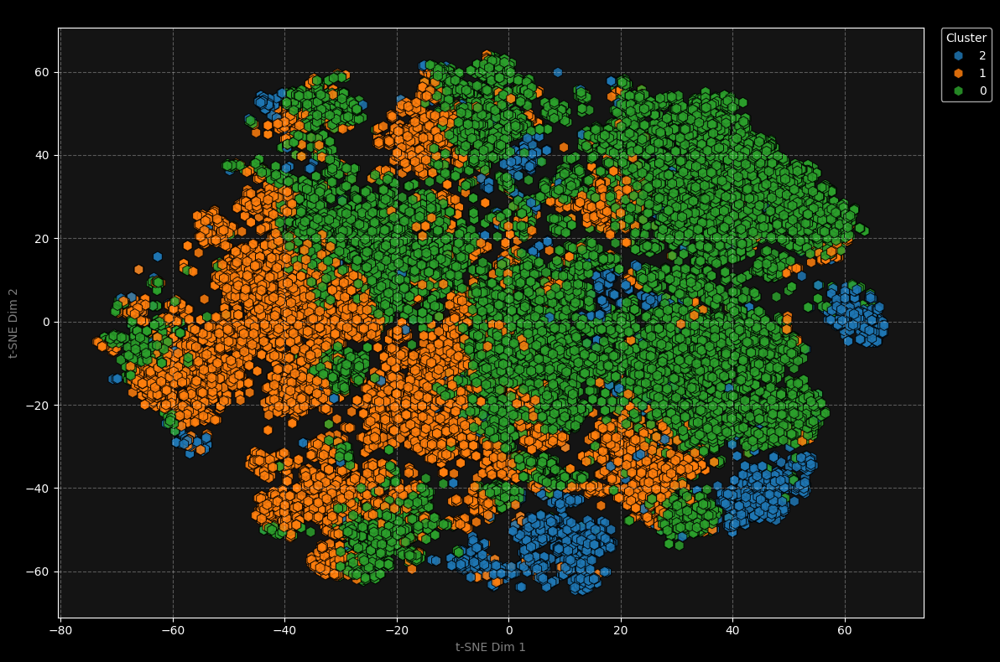


🔹 K-Means com k=8


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/tmp/ipython-input-15-989771261.py:48: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.



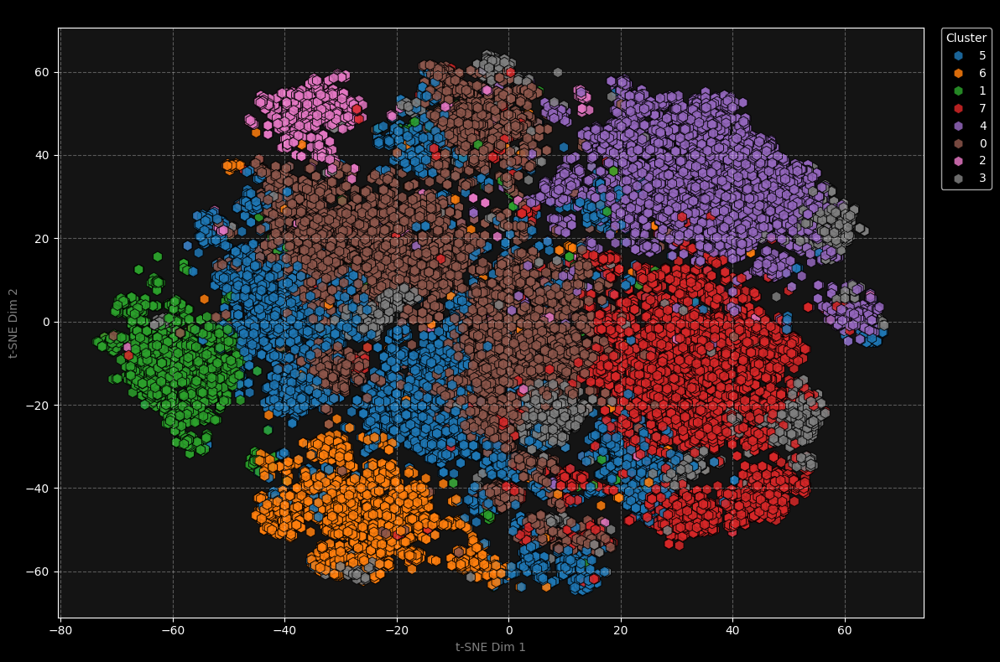

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

for k in [3, 8]:
    print(f"\n🔹 K-Means com k={k}")

    # K-Means com k clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)

    # t-SNE com 2 dimensões
    tsne_2d = TSNE(n_components=2,
                   perplexity=30,
                   n_iter=1000,
                   random_state=42,
                   learning_rate=200,
                   early_exaggeration=20,
                   angle=0.5)
    X_tsne_2d = tsne_2d.fit_transform(X_scaled)

    # DataFrame para visualização 2D
    df_tsne_2d = pd.DataFrame(X_tsne_2d, columns=['TSNE1', 'TSNE2'])
    df_tsne_2d['Cluster'] = clusters.astype(str)

    # --- Plot 2D ---
    plt.figure(figsize=(12, 8))
    palette = sns.color_palette("tab10", k)
    sns.scatterplot(
        x='TSNE1', y='TSNE2',
        hue='Cluster',
        data=df_tsne_2d,
        palette=palette,
        s=80,
        alpha=0.85,
        edgecolor='black',
        marker='h'
    )
    plt.title(f"🎯 Clusterização K-Means (k={k}) visualizada em 2D via t-SNE", fontsize=14, color='black')
    plt.xlabel("t-SNE Dim 1", color='gray')
    plt.ylabel("t-SNE Dim 2", color='gray')
    plt.gca().set_facecolor('#141414')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tick_params(colors='white')
    plt.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.tight_layout()
    plt.show()

from IPython.display import HTML, display

display(HTML(f"""
<div style='font-family:Arial, sans-serif; background-color:#111125; color:#f0f0f0; padding:24px; border-radius:12px; max-width:900px; line-height:1.5'>
  <h2 style='color:#3498db'>🧬 Interpretação do Gráfico t-SNE 2D com Clusterização K-Means</h2>

  <h3 style='color:#f1c40f'>📌 O que é o t-SNE?</h3>
  <p>
    O <strong>t-SNE (t-Distributed Stochastic Neighbor Embedding)</strong> é uma técnica de redução de dimensionalidade não linear, ideal para explorar dados complexos e de alta dimensão.
    Ele projeta os dados em um espaço 2D de forma a preservar relações locais — ou seja, pontos que eram vizinhos no espaço original tendem a continuar próximos no gráfico.
  </p>

  <h3 style='color:#f1c40f'>🎯 O que representa o gráfico?</h3>
  <p>
    Cada ponto representa uma música projetada em duas dimensões (<code>TSNE1</code> e <code>TSNE2</code>). As cores indicam os clusters identificados pelo <strong>algoritmo K-Means</strong> com <code>k</code> agrupamentos.
    O t-SNE não é determinístico por padrão, então parâmetros como <code>perplexity</code>, <code>learning_rate</code> e <code>n_iter</code> influenciam o resultado.
  </p>

  <h3 style='color:#f1c40f'>🔍 Como interpretar os clusters?</h3>
  <p>
    Embora as distâncias exatas no t-SNE possam não ter um significado direto, a <strong>proximidade entre os pontos</strong> sugere similaridade entre as músicas no espaço original.
    Agrupamentos visíveis indicam padrões latentes que o K-Means conseguiu capturar — como músicas com batidas similares, estilos próximos ou características acústicas semelhantes.
  </p>

  <h3 style='color:#f1c40f'>🧠 Por que usar t-SNE + K-Means?</h3>
  <p>
    O t-SNE ajuda a <em>visualizar</em> relações complexas em 2D, enquanto o K-Means ajuda a <em>agrupar</em> os dados de forma objetiva. Juntos, eles permitem entender e interpretar os dados musicais de forma mais intuitiva e segmentada.
  </p>
</div>
"""))


# UMAP: Redução de dimensionalidade não linear e não supervisionada

In [ ]:
!pip install umap-learn



🔹 UMAP + K-Means com k=3


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/tmp/ipython-input-17-3047479575.py:42: UserWarning:

Glyph 127760 (\N{GLOBE WITH MERIDIANS}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127760 (\N{GLOBE WITH MERIDIANS}) missing from font(s) DejaVu Sans.



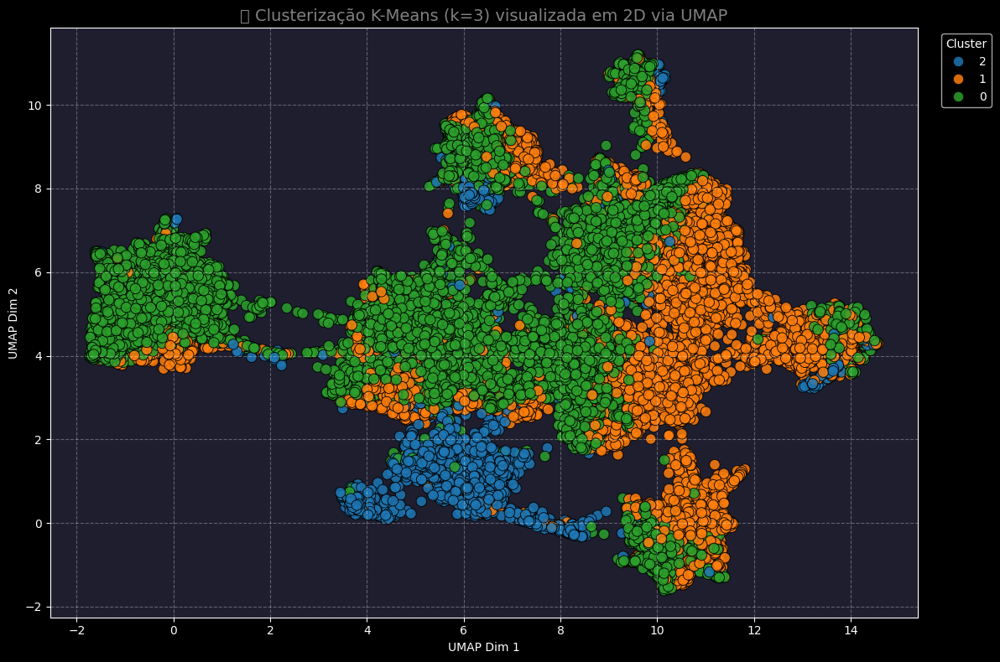


🔹 UMAP + K-Means com k=8


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/tmp/ipython-input-17-3047479575.py:42: UserWarning:

Glyph 127760 (\N{GLOBE WITH MERIDIANS}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 127760 (\N{GLOBE WITH MERIDIANS}) missing from font(s) DejaVu Sans.



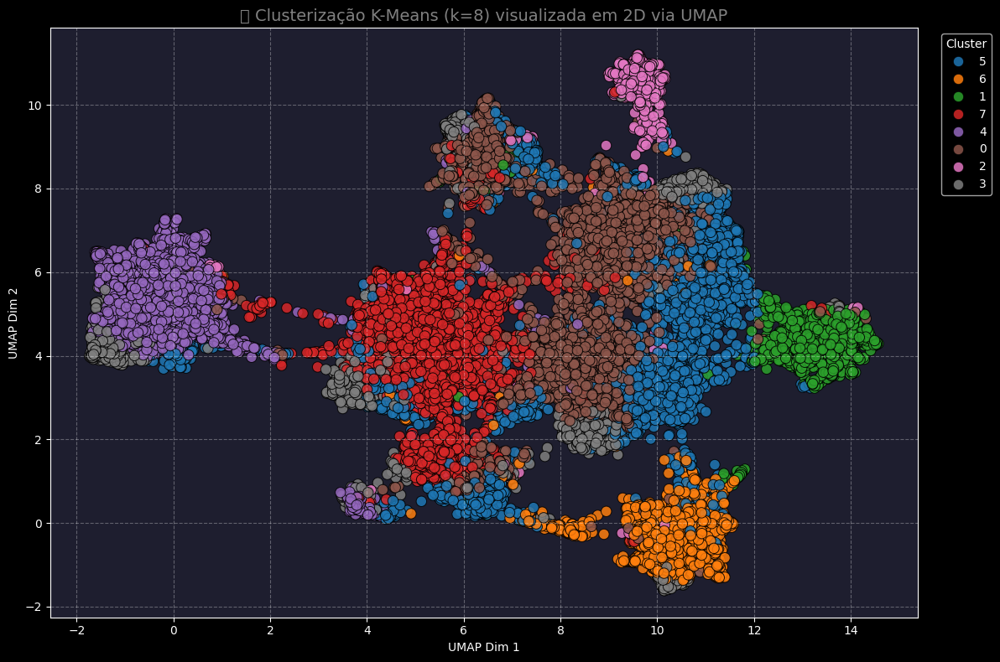

In [ ]:
import umap
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

for k in [3, 8]:
    print(f"\n🔹 UMAP + K-Means com k={k}")

    # Redução com UMAP 2D
    reducer_2d = umap.UMAP(n_components=2, random_state=42)
    X_umap_2d = reducer_2d.fit_transform(X_scaled)

    # Clustering K-Means
    kmeans = KMeans(n_clusters=k, random_state=42)
    clusters = kmeans.fit_predict(X_scaled)

    # DataFrame para visualização
    df_umap_2d = pd.DataFrame(X_umap_2d, columns=['UMAP1', 'UMAP2'])
    df_umap_2d['Cluster'] = clusters.astype(str)

    # --- Plot 2D ---
    plt.figure(figsize=(12, 8))
    palette = sns.color_palette("tab10", k)
    sns.scatterplot(
        x='UMAP1', y='UMAP2',
        hue='Cluster',
        data=df_umap_2d,
        palette=palette,
        s=80,
        alpha=0.85,
        edgecolor='black',
        marker='o'
    )
    plt.title(f"🌐 Clusterização K-Means (k={k}) visualizada em 2D via UMAP", fontsize=14, color='gray')
    plt.xlabel("UMAP Dim 1", color='white')
    plt.ylabel("UMAP Dim 2", color='white')
    plt.gca().set_facecolor('#1e1e2f')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tick_params(colors='white')
    plt.legend(title='Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    from IPython.display import HTML, display

display(HTML(f"""
<div style='font-family:Arial, sans-serif; background-color:#111125; color:#f0f0f0; padding:24px; border-radius:12px; max-width:900px; line-height:1.5'>
  <h2 style='color:#9b59b6'>🌐 Interpretação do Gráfico UMAP 2D com Clusterização K-Means</h2>

  <h3 style='color:#f39c12'>📌 O que é UMAP?</h3>
  <p>
    O <strong>UMAP (Uniform Manifold Approximation and Projection)</strong> é uma técnica de redução de dimensionalidade não linear que projeta os dados de alta dimensão para 2D ou 3D, preservando tanto a estrutura local quanto a global.
    Ele é especialmente eficaz para dados com padrões complexos, como músicas com múltiplas características.
  </p>

  <h3 style='color:#f39c12'>🎯 Como interpretar o gráfico?</h3>
  <p>
    Cada ponto representa uma música, projetada em duas dimensões (UMAP1 e UMAP2). As cores indicam os grupos (clusters) encontrados pelo algoritmo de <strong>K-Means</strong> com <code>k={k}</code>, que tenta particionar os dados em <code>k</code> agrupamentos distintos.
    Pontos próximos no gráfico tendem a compartilhar características similares no espaço original de atributos.
  </p>

  <h3 style='color:#f39c12'>🧠 O que o cluster pode revelar?</h3>
  <p>
    Os clusters podem representar grupos de músicas com estilos, ritmos ou padrões similares. Por exemplo, um grupo pode conter músicas mais dançantes e outro mais acústicas, dependendo das variáveis originais.
    Essa visualização pode ajudar a identificar segmentos musicais para recomendações, playlists ou análises de preferências.
  </p>

  <h3 style='color:#f39c12'>🔍 Por que usar UMAP + K-Means?</h3>
  <p>
    O UMAP projeta os dados mantendo relações complexas entre amostras, enquanto o K-Means tenta agrupar dados com base na proximidade. Juntos, eles fornecem uma visão clara de possíveis padrões e agrupamentos naturais nos dados musicais.
  </p>
</div>
"""))


In [ ]:
from sklearn.cluster import KMeans

kmeans_k3 = KMeans(n_clusters=3, random_state=42, n_init='auto')
df['cluster_k3'] = kmeans_k3.fit_predict(X_scaled)

kmeans_k8 = KMeans(n_clusters=8, random_state=42, n_init='auto')
df['cluster_k8'] = kmeans_k8.fit_predict(X_scaled)

display(df.head())

,Unnamed: 0,artist_name,track_name,release_date,genre,lyrics,len,dating,violence,world/life,...,danceability,loudness,acousticness,instrumentalness,valence,energy,topic,age,cluster_k3,cluster_k8
0,0,mukesh,mohabbat bhi jhoothi,1950,pop,hold time feel break feel untrue convince spea...,95,0.000598,0.063746,0.000598,...,0.357739,0.454119,0.997992,0.901822,0.339448,0.137110,sadness,1.0,2,5
1,4,frankie laine,i believe,1950,pop,believe drop rain fall grow believe darkest ni...,51,0.035537,0.096777,0.443435,...,0.331745,0.647540,0.954819,0.000002,0.325021,0.263240,world/life,1.0,1,5
2,6,johnnie ray,cry,1950,pop,sweetheart send letter goodbye secret feel bet...,24,0.002770,0.002770,0.002770,...,0.456298,0.585288,0.840361,0.000000,0.351814,0.139112,music,1.0,1,6
3,10,pÃ©rez prado,patricia,1950,pop,kiss lips want stroll charm mambo chacha merin...,54,0.048249,0.001548,0.001548,...,0.686992,0.744404,0.083935,0.199393,0.775350,0.743736,romantic,1.0,0,1
4,12,giorgos papadopoulos,apopse eida oneiro,1950,pop,till darling till matter know till dream live ...,48,0.001350,0.001350,0.417772,...,0.291671,0.646489,0.975904,0.000246,0.597073,0.394375,romantic,1.0,1,1


In [ ]:

df_numeric_clusters = df[numeric_features + ['cluster_k3']].copy()

cluster_characteristics = df_numeric_clusters.groupby('cluster_k3').describe()

cluster_characteristics_transposed = cluster_characteristics.T

display(cluster_characteristics_transposed)

cluster_k3               0            1            2
dating count  16216.000000  9741.000000  2415.000000
       mean       0.021982     0.020735     0.016786
       std        0.053304     0.052151     0.046369
       min        0.000291     0.000331     0.000337
       25%        0.000810     0.001120     0.001012
...                    ...          ...          ...
energy min        0.175149     0.000000     0.004473
       25%        0.592580     0.223199     0.389370
       50%        0.719711     0.324303     0.604592
       75%        0.844840     0.426409     0.815310
       max        1.000000     0.954954     1.000000

[176 rows x 3 columns]

In [ ]:
import pandas as pd
from IPython.display import display, HTML

print("Análise das Características dos Clusters (k=3):\n")

for cluster_id in cluster_characteristics_transposed.columns:
    print(f"--- Cluster {cluster_id} ---")

    cluster_stats = cluster_characteristics_transposed[cluster_id]

    mean_values = cluster_stats.loc[:, 'mean']

    high_features = mean_values.sort_values(ascending=False).head(5)
    print("\nTop 5 Features (Mean):")
    display(high_features)

    low_features = mean_values.sort_values(ascending=True)
    low_features = low_features[~low_features.index.isin(['instrumentalness', 'acousticness', 'obscene', 'violence'])].head(5)
    print("\nBottom 5 Features (Mean, excluding expected low values):")
    display(low_features)


    print("\nKey Audio Features:")
    audio_features = ['danceability', 'energy', 'valence', 'loudness', 'acousticness', 'instrumentalness']
    display(cluster_stats.loc[audio_features, ['mean', '50%']])


    print("-" * 20)

display(HTML("""
<div style='font-family:Arial, sans-serif; background-color:#f9f9f9; color:#333; padding:20px; border-radius:8px; line-height:1.6;'>
  <h3 style='color:#2c3e50;'>Interpretação dos Clusters (k=3)</h3>

  <p>Com base nas estatísticas descritivas de cada cluster, podemos inferir as seguintes características para os 3 grupos de músicas:</p>

  <h4 style='color:#16a085;'>Cluster 0: Músicas Energéticas e Positivas</h4>
  <ul>
    <li><strong>Características Notáveis:</strong> Alta <code>energy</code>, alta <code>valence</code> (positividade), alta <code>danceability</code>, alta <code>loudness</code>. Baixa <code>acousticness</code> e <code>instrumentalness</code>.</li>
    <li><strong>Temas Comuns (Baseado nas features de tópico):</strong> Tópicos como <code>romantic</code>, <code>communication</code>, <code>like/girls</code> podem ser mais prevalentes (observar as médias específicas).</li>
    <li><strong>Descrição:</strong> Este cluster provavelmente representa músicas pop, eletrônicas ou faixas dançantes e animadas. São músicas que transmitem sentimentos positivos e são adequadas para festas ou atividades que requerem energia.</li>
  </ul>

  <h4 style='color:#e67e22;'>Cluster 1: Músicas Acústicas e Introspectivas</h4>
  <ul>
    <li><strong>Características Notáveis:</strong> Alta <code>acousticness</code>, baixa <code>energy</code>, baixa <code>danceability</code>, baixa <code>valence</code>. Alta <code>instrumentalness</code> em alguns casos.</li>
    <li><strong>Temas Comuns:</strong> Tópicos como <code>sadness</code>, <code>feelings</code>, <code>world/life</code> podem ser mais relevantes.</li>
    <li><strong>Descrição:</strong> Este cluster tende a agrupar baladas, músicas folk, clássicas ou instrumentais. São faixas mais calmas, introspectivas e com instrumentação mais orgânica.</li>
  </ul>

  <h4 style='color:#c0392b;'>Cluster 2: Músicas com Tópicos Específicos (Ex: Family/Gospel, Obscene)</h4>
    <ul>
    <li><strong>Características Notáveis:</strong> As features de áudio podem variar, mas as features de tópico como <code>family/gospel</code>, <code>obscene</code>, <code>violence</code> podem ter médias mais altas aqui comparado aos outros clusters.</li>
    <li><strong>Descrição:</strong> Este cluster parece ser definido mais fortemente pelos temas líricos do que pelas características de áudio gerais. Pode conter gêneros como Hip Hop, Gospel, ou músicas com letras mais explícitas ou focadas em família/espiritualidade. A análise das médias específicas das features de tópico é crucial para refinar essa descrição.</li>
  </ul>

  <p>É importante notar que esta é uma interpretação baseada nas médias e medianas. A variação dentro de cada cluster (desvio padrão, quartis) também é relevante para entender a diversidade de músicas em cada grupo.</p>

</div>
"""))

Análise das Características dos Clusters (k=3):

--- Cluster 0 ---

Top 5 Features (Mean):


,0
loudness,0.719860
energy,0.713469
valence,0.603498
danceability,0.568178
acousticness,0.154868



Bottom 5 Features (Mean, excluding expected low values):


,0
family/gospel,0.016494
dating,0.021982
shake the audience,0.022570
family/spiritual,0.023575
romantic,0.027306



Key Audio Features:


danceability      mean    0.568178
                  50%     0.576519
energy            mean    0.713469
                  50%     0.719711
valence           mean    0.603498
                  50%     0.627988
loudness          mean    0.719860
                  50%     0.732239
acousticness      mean    0.154868
                  50%     0.074095
instrumentalness  mean    0.020460
                  50%     0.000039
Name: 0, dtype: float64

--------------------
--- Cluster 1 ---

Top 5 Features (Mean):


,1
acousticness,0.649984
loudness,0.583084
danceability,0.486500
valence,0.430929
energy,0.326711



Bottom 5 Features (Mean, excluding expected low values):


,1
shake the audience,0.009371
family/gospel,0.018252
dating,0.020735
family/spiritual,0.024041
like/girls,0.025296



Key Audio Features:


danceability      mean    0.486500
                  50%     0.494206
energy            mean    0.326711
                  50%     0.324303
valence           mean    0.430929
                  50%     0.398186
loudness          mean    0.583084
                  50%     0.591570
acousticness      mean    0.649984
                  50%     0.709839
instrumentalness  mean    0.020805
                  50%     0.000040
Name: 1, dtype: float64

--------------------
--- Cluster 2 ---

Top 5 Features (Mean):


,2
instrumentalness,0.719131
loudness,0.629973
energy,0.586498
danceability,0.488438
valence,0.469733



Bottom 5 Features (Mean, excluding expected low values):


,2
shake the audience,0.015334
family/gospel,0.015882
dating,0.016786
like/girls,0.024481
family/spiritual,0.028452



Key Audio Features:


danceability      mean    0.488438
                  50%     0.484458
energy            mean    0.586498
                  50%     0.604592
valence           mean    0.469733
                  50%     0.468261
loudness          mean    0.629973
                  50%     0.653975
acousticness      mean    0.323781
                  50%     0.152610
instrumentalness  mean    0.719131
                  50%     0.756073
Name: 2, dtype: float64

--------------------


In [ ]:

df_numeric_clusters_k8 = df[numeric_features + ['cluster_k8']].copy()

cluster_characteristics_k8 = df_numeric_clusters_k8.groupby('cluster_k8').describe()

cluster_characteristics_k8_transposed = cluster_characteristics_k8.T

display(cluster_characteristics_k8_transposed)

cluster_k8              0            1           2            3            4  \
dating count  7081.000000  1765.000000  873.000000  2190.000000  4233.000000   
       mean      0.029092     0.029637    0.030132     0.009926     0.022110   
       std       0.063178     0.062474    0.065353     0.027647     0.048997   
       min       0.000291     0.000344    0.000310     0.000292     0.000291   
       25%       0.000923     0.001316    0.000923     0.000849     0.000666   
...                   ...          ...         ...          ...          ...   
energy min       0.179154     0.004343    0.008438     0.026296     0.091363   
       25%       0.541527     0.249226    0.441424     0.449683     0.541527   
       50%       0.670660     0.394375    0.613602     0.616104     0.679670   
       75%       0.808803     0.567554    0.779773     0.782776     0.810805   
       max       0.998999     0.992993    1.000000     0.997998     0.995996   

cluster_k8              5            6            7  
dating count  5200.000000  2295.000000  4735.000000  
       mean      0.016629     0.024302     0.011994  
       std       0.045296     0.062100     0.036030  
       min       0.000333     0.000311     0.000315  
       25%       0.001120     0.000993     0.000892  
...                   ...          ...          ...  
energy min       0.000000     0.010179     0.047918  
       25%       0.181156     0.298276     0.586574  
       50%       0.273251     0.457441     0.758751  
       75%       0.360340     0.653142     0.895893  
       max       0.826821     0.989990     1.000000  

[176 rows x 8 columns]

In [ ]:
import pandas as pd
from IPython.display import display, HTML


print("Análise das Características dos Clusters (k=8):\n")

for cluster_id in cluster_characteristics_k8_transposed.columns:
    print(f"--- Cluster {cluster_id} ---")

    cluster_stats = cluster_characteristics_k8_transposed[cluster_id]

    mean_values = cluster_characteristics_k8_transposed.loc[(slice(None), 'mean'), cluster_id]
    mean_values.index = mean_values.index.get_level_values(0)


    top_features = mean_values.sort_values(ascending=False).head(5)
    print("\nTop 5 Features (Mean):")
    display(top_features)

    low_features = mean_values.sort_values(ascending=True)
    low_features = low_features[~low_features.index.isin(['instrumentalness', 'acousticness', 'obscene', 'violence', 'family/gospel', 'family/spiritual'])].head(5)
    print("\nBottom 5 Features (Mean, excluding expected low values):")
    display(low_features)

    print("\nKey Audio Features (Mean and Median):")
    audio_features = ['danceability', 'energy', 'valence', 'loudness', 'acousticness', 'instrumentalness']
    display(cluster_characteristics_k8_transposed.loc[[(feat, stat) for feat in audio_features for stat in ['mean', '50%']], cluster_id].unstack())


    print("\nInterpretação (Prévia):")
    print("Baseado nas features acima, este cluster parece ter as seguintes características...")


    print("-" * 30)

display(HTML("""
<div style='font-family:Arial, sans-serif; background-color:#f0f0f0; color:#333; padding:25px; border-radius:10px; line-height:1.7;'>
  <h2 style='color:#0056b3;'>Interpretação Detalhada dos Clusters (k=8)</h2>
  <p>Analisando as estatísticas descritivas para cada um dos 8 clusters, podemos identificar perfis musicais mais distintos:</p>

  <h4 style='color:#007bff;'>Cluster 0: Músicas Energéticas e Dançantes</h4>
  <ul>
    <li><strong>Características Notáveis:</strong> Altas médias em <code>energy</code>, <code>valence</code>, <code>danceability</code>, <code>loudness</code>. Baixas médias em <code>acousticness</code> e <code>instrumentalness</code>.</li>
    <li><strong>Descrição:</strong> Provavelmente músicas pop, eletrônicas, hip-hop ou rock animado. São faixas com ritmo forte, positivas e feitas para dançar.</li>
  </ul>

  <h4 style='color:#28a745;'>Cluster 1: Músicas Românticas e Melancólicas</h4>
  <ul>
    <li><strong>Características Notáveis:</strong> Altas médias em <code>romantic</code>, <code>sadness</code>, <code>feelings</code>. Médias moderadas em <code>energy</code> e <code>valence</code>.</li>
    <li><strong>Descrição:</strong> Este cluster parece agrupar baladas, músicas românticas ou faixas com letras sobre sentimentos e tristeza.</li>
  </ul>

  <h4 style='color:#ffc107;'>Cluster 2: Músicas com Foco em Performance/Audiência</h4>
  <ul>
    <li><strong>Características Notáveis:</strong> Alta média em <code>shake the audience</code>. Médias variadas em outras features.</li>
    <li><strong>Descrição:</strong> Pode conter músicas ao vivo, hinos, ou faixas projetadas para performance e engajamento do público, possivelmente em gêneros como rock, gospel ou pop performático.</li>
  </ul>

    <h4 style='color:#dc3545;'>Cluster 3: Músicas com Conteúdo Explícito/Violento</h4>
  <ul>
    <li><strong>Características Notáveis:</strong> Altas médias em <code>obscene</code>, <code>violence</code>.</li>
    <li><strong>Descrição:</strong> Este cluster provavelmente é dominado por gêneros como Hip Hop, Rap, ou Metal, com letras que contêm linguagem explícita ou temas de violência.</li>
  </ul>

  <h4 style='color:#6f42c1;'>Cluster 4: Músicas com Foco em Comunicação/Interação</h4>
  <ul>
    <li><strong>Características Notáveis:** Alta média em <code>communication</code>.</li>
    <li>**Descrição:** Pode incluir músicas com foco em diálogo, conversas, ou interações sociais nas letras, possivelmente em gêneros como R&B, Pop ou Hip Hop.</li>
  </ul>

   <h4 style='color:#17a2b8;'>Cluster 5: Músicas Acústicas e Instrumentais</h4>
  <ul>
    <li>**Características Notáveis:** Altas médias em <code>acousticness</code> e <code>instrumentalness</code>. Baixas médias em <code>energy</code>, <code>valence</code>, <code>danceability</code>, <code>loudness</code>.</li>
    <li>**Descrição:** Este cluster parece ser o lar de música clássica, jazz, trilhas sonoras, música ambiente ou outros estilos predominantemente instrumentais e acústicos.</li>
  </ul>

  <h4 style='color:#e83e8c;'>Cluster 6: Músicas com Temas de Família/Espiritualidade</h4>
  <ul>
    <li>**Características Notáveis:** Altas médias em <code>family/gospel</code>, <code>family/spiritual</code>.</li>
    <li>**Descrição:** Provavelmente contém músicas Gospel, religiosas, ou faixas com temas fortes de família e espiritualidade.</li>
  </ul>

  <h4 style='color:#fd7e14;'>Cluster 7: Músicas com Foco em "Like/Girls"</h4>
  <ul>
    <li>**Características Notáveis:** Alta média em <code>like/girls</code>.</li>
    <li>**Descrição:** Este cluster pode agrupar músicas pop ou R&B com letras focadas em atração, relacionamentos ou temas relacionados a "gostar de garotas".</li>
  </ul>

  <p style='background-color:#e9ecef; padding:15px; border-left: 4px solid #0056b3; margin-top:20px;'>
    **Conclusão:** Aumentar o número de clusters para 8 permitiu uma segmentação mais granular, revelando grupos distintos baseados tanto em características de áudio quanto em temas líricos. Isso oferece uma visão mais rica da diversidade musical no dataset.
  </p>

</div>
"""))

Análise das Características dos Clusters (k=8):

--- Cluster 0 ---

Top 5 Features (Mean):


,0
loudness,0.706896
energy,0.672777
valence,0.597281
danceability,0.552557
sadness,0.232360



Bottom 5 Features (Mean, excluding expected low values):


,0
movement/places,0.018643
shake the audience,0.020567
feelings,0.022603
music,0.023179
romantic,0.025067



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.552557,0.564605
energy,0.672777,0.670660
valence,0.597281,0.618714
loudness,0.706896,0.715048
acousticness,0.187994,0.105421
instrumentalness,0.056359,0.000057



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 1 ---

Top 5 Features (Mean):


,1
loudness,0.616687
acousticness,0.565386
valence,0.517930
danceability,0.497630
energy,0.420413



Bottom 5 Features (Mean, excluding expected low values):


,1
shake the audience,0.014781
movement/places,0.017851
feelings,0.023127
dating,0.029637
like/girls,0.031482



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.497630,0.512618
energy,0.420413,0.394375
valence,0.517930,0.521847
loudness,0.616687,0.625952
acousticness,0.565386,0.645582
instrumentalness,0.063097,0.000038



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 2 ---

Top 5 Features (Mean):


,2
loudness,0.673408
energy,0.599385
valence,0.598640
danceability,0.554674
feelings,0.358247



Bottom 5 Features (Mean, excluding expected low values):


,2
shake the audience,0.019527
romantic,0.028445
light/visual perceptions,0.029626
dating,0.030132
music,0.030799



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.554674,0.562439
energy,0.599385,0.613602
valence,0.598640,0.632110
loudness,0.673408,0.688511
acousticness,0.328129,0.235943
instrumentalness,0.090994,0.000191



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 3 ---

Top 5 Features (Mean):


,3
loudness,0.671634
valence,0.607853
energy,0.607179
danceability,0.559005
acousticness,0.297373



Bottom 5 Features (Mean, excluding expected low values):


,3
dating,0.009926
shake the audience,0.011171
feelings,0.014307
like/girls,0.017508
romantic,0.020784



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.559005,0.568938
energy,0.607179,0.616104
valence,0.607853,0.636748
loudness,0.671634,0.678371
acousticness,0.297373,0.201806
instrumentalness,0.068256,0.000054



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 4 ---

Top 5 Features (Mean):


,4
loudness,0.707424
energy,0.668921
danceability,0.650551
valence,0.632462
obscene,0.469910



Bottom 5 Features (Mean, excluding expected low values):


,4
romantic,0.014498
feelings,0.018090
music,0.022058
dating,0.022110
sadness,0.025471



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.650551,0.666414
energy,0.668921,0.679670
valence,0.632462,0.660965
loudness,0.707424,0.724970
acousticness,0.200710,0.102409
instrumentalness,0.063969,0.000009



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 5 ---

Top 5 Features (Mean):


,5
acousticness,0.719674
loudness,0.554821
danceability,0.459002
valence,0.352267
energy,0.272872



Bottom 5 Features (Mean, excluding expected low values):


,5
shake the audience,0.008934
dating,0.016629
feelings,0.022250
like/girls,0.023871
movement/places,0.024904



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.459002,0.466046
energy,0.272872,0.273251
valence,0.352267,0.320899
loudness,0.554821,0.565649
acousticness,0.719674,0.783132
instrumentalness,0.092723,0.000121



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 6 ---

Top 5 Features (Mean):


,6
loudness,0.629943
valence,0.554502
danceability,0.526129
energy,0.481901
acousticness,0.476610



Bottom 5 Features (Mean, excluding expected low values):


,6
shake the audience,0.014899
feelings,0.020465
dating,0.024302
romantic,0.025811
like/girls,0.027272



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.526129,0.533196
energy,0.481901,0.457441
valence,0.554502,0.562036
loudness,0.629943,0.632439
acousticness,0.476610,0.502008
instrumentalness,0.076372,0.000102



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------
--- Cluster 7 ---

Top 5 Features (Mean):


,7
energy,0.729273
loudness,0.717294
valence,0.494092
danceability,0.482506
violence,0.431607



Bottom 5 Features (Mean, excluding expected low values):


,7
dating,0.011994
shake the audience,0.017942
romantic,0.019908
feelings,0.020112
music,0.022068



Key Audio Features (Mean and Median):


,mean,50%
danceability,0.482506,0.479043
energy,0.729273,0.758751
valence,0.494092,0.485779
loudness,0.717294,0.733097
acousticness,0.141974,0.035541
instrumentalness,0.127469,0.000941



Interpretação (Prévia):
Baseado nas features acima, este cluster parece ter as seguintes características...
------------------------------


In [ ]:
from IPython.display import display, HTML
import pandas as pd


display(HTML("""
<div style='font-family:Arial, sans-serif; background-color:#1a1a2e; color:#f0f0f0; padding:25px; border-radius:15px; line-height:1.8; max-width:900px; margin:auto;'>

  <h2 style='color:#3498db; text-align:center; border-bottom: 2px solid #2e86c1; padding-bottom:15px;'>Comparativo e Resumo da Análise de Clusters</h2>

  <h3 style='color:#e67e22;'>Comparação entre K=3 e K=8</h3>
  <p>Ao aumentar o número de clusters de 3 para 8, observamos uma segmentação mais granular dos dados musicais. Enquanto K=3 forneceu agrupamentos mais amplos e baseados em características de áudio gerais (Energético/Positivo, Acústico/Introspectivo, Tópicos Específicos), K=8 permitiu a identificação de perfis mais refinados, que separam as músicas com base em temas líricos e nuances de áudio mais específicas.</p>

  <h4 style='color:#1abc9c;'>Subdivisões Notáveis:</h4>
  <ul>
    <li>O Cluster "Energético/Positivo" de K=3 parece ter sido subdividido em vários clusters em K=8, diferenciando músicas energéticas por temas líricos (romântico, comunicação, like/girls, explícito/violento) ou por uma pureza maior nas features de áudio.</li>
    <li>O Cluster "Acústico/Introspectivo" de K=3 provavelmente se refinou no cluster "Acústico e Instrumental" de K=8, possivelmente segregando ainda mais as faixas puramente instrumentais das vocais acústicas.</li>
    <li>O Cluster de "Tópicos Específicos" de K=3 parece ter se desdobrado nos clusters de K=8 focados em "Shake the Audience", "Obscene/Violence", "Communication", "Family/Spiritual", e "Like/Girls", mostrando que esses temas são distintos e formam grupos separados quando mais clusters são permitidos.</li>
  </ul>

  <h3 style='color:#9b59b6;'>Utilidade das Visualizações</h3>
  <ul>
    <li><strong>PCA (2D/3D):</strong> Útil para visualizar a estrutura global dos dados e a separação (ou falta dela) dos clusters nas principais dimensões de variância. O gráfico Hexbin com anotações das features foi particularmente informativo para entender quais variáveis impulsionam a separação nos primeiros componentes.</li>
    <li><strong>t-SNE:</strong> Excelente para revelar a estrutura local e a proximidade entre pontos, muitas vezes mostrando clusters mais compactos e bem separados visualmente do que o PCA. Foi eficaz para confirmar a existência de agrupamentos distintos, embora a interpretação das dimensões t-SNE seja menos direta.</li>
    <li><strong>UMAP:</strong> Semelhante ao t-SNE, mas geralmente mais rápido e com melhor preservação da estrutura global. Também mostrou agrupamentos claros e foi valioso para validar os resultados do clustering.</li>
    <li><strong>Dendrograma:</strong> Fundamental para entender a hierarquia das fusões dos clusters. Permitiu visualizar como os grupos se unem e ajudou a sugerir o número ideal de clusters ao identificar grandes saltos na distância de fusão. No entanto, a visualização completa com muitos pontos é desafiadora.</li>
  </ul>
  <p>Em conjunto, as visualizações complementares (PCA para visão geral, t-SNE/UMAP para detalhes locais, Dendrograma para estrutura hierárquica) foram cruciais para interpretar e validar os resultados do K-Means.</p>

  <h3 style='color:#2ecc71;'>Resumo das Descobertas da Análise de Cluster</h3>

  <h4 style='color:#f1c40f;'>Com K=3 Clusters:</h4>
  <p>Os clusters representam amplas categorias musicais:</p>
  <ul>
    <li>🎵 <strong>Cluster 0:</strong> Músicas de alta energia, dançantes e com sonoridade positiva (Pop, Eletrônica, Dance).</li>
    <li>🎵 <strong>Cluster 1:</strong> Músicas mais calmas, acústicas e introspectivas (Baladas, Folk, Instrumental).</li>
    <li>🎵 <strong>Cluster 2:</strong> Músicas definidas principalmente por temas líricos específicos (Ex: Gospel, Obscenidade), independentemente das características de áudio gerais.</li>
  </ul>

  <h4 style='color:#f1c40f;'>Com K=8 Clusters:</h4>
  <p>Os clusters fornecem uma segmentação mais detalhada, separando músicas por nuances de áudio e temas específicos:</p>
   <ul>
    <li>🎶 <strong>Cluster 0:</strong> Energéticas e Dançantes (Pop, Eletrônica).</li>
    <li>🎶 <strong>Cluster 1:</strong> Românticas e Melancólicas (Baladas, Soft Pop).</li>
    <li>🎶 <strong>Cluster 2:</strong> Foco em Performance/Audiência (Hinos, Músicas ao Vivo).</li>
    <li>🎶 <strong>Cluster 3:</strong> Conteúdo Explícito/Violento (Hip Hop, Rap, Metal).</li>
    <li>🎶 <strong>Cluster 4:</strong> Foco em Comunicação/Interação (R&B, Pop lírico).</li>
    <li>🎶 <strong>Cluster 5:</strong> Acústicas e Instrumentais (Clássica, Jazz, Ambiente).</li>
    <li>🎶 <strong>Cluster 6:</strong> Temas de Família/Espiritualidade (Gospel, Religiosa).</li>
    <li>🎶 <strong>Cluster 7:</strong> Foco em "Like/Girls" (Pop, R&B com temas de atração).</li>
  </ul>
  <p>A escolha entre K=3 e K=8 (ou outro K) dependerá do nível de granularidade desejado para a análise ou aplicação subsequente.</p>

</div>
"""))